# Importing libraries

In [474]:
import fitz
import pandas as pd
import re
import os
from tqdm import tqdm
import numpy as np
import pdfplumber
import json
import seaborn as sns

# Importing Data

In [475]:
df = pd.read_csv('Final qf list_cleaned 2Sept25.csv')
df.head()

,Title,Code,Description,Sector Name,Level,Maximum Notational Hours,Minimum Notational Hours,Version,Originally Approved,Valid Till,Awarding Body,Certifying Bodies,Proposed Occupation,Progression Pathway,Qualifcation Type,Adopted Qualifcation,Training Delivery Hours,NQR code,Qf link,pdf_number
0,Fire Safety Technician (Oil & Gas),2020/HYC/HSSCI/3611,The main responsibility of the fire safety tec...,Hydrocarbon,Level 4,450 Hours,450 Hours,Version,17 Nov 2022,16 Nov 2025,Hydrocarbon Sector Skill Council (HSSCI),Hydrocarbon Sector Skill Council,"Management of Health, Safety and Environment (...",Senior Fire Safety Technician,General Qualification,N.A.,"{""Theory"":""120"",""Practical"":""240"",""Employabili...",2020/HYC/HSSCI/3611,https://www.nqr.gov.in/qualification/file/STT-...,0
1,Hindi Typist,2020/OAFM/MEPSC/03792,"The Hindi Typist, is responsible for formattin...",Management,Level 4,450 Hours,390 Hours,Version,17 Nov 2022,17 Nov 2025,Management & Entrepreneurship and Professional...,Management Entrepreneurship and Professional S...,Office Support,Multi-functional Office Executive,General Qualification,N.A.,"{""Theory"":""150"",""Practical"":""180"",""Employabili...",2020/OAFM/MEPSC/03792,https://www.nqr.gov.in/qualification/file/QFil...,1
2,Certificate Course in Coding Skills,2020/ITES/ASAP/03802,Individuals at this job are responsible for de...,IT-ITeS,Level 5,270 Hours,270 Hours,Version,25 Jun 2020,01 Mar 2026,"Additional Skill Acquisition Programme, Govern...","Additional Skill Acquisition Programme, Govern...",Software Engineer /Project Engineer,"VERTICAL PROGRESSION \nEngineer Trainee, Proje...","Future Skills Qualification,General Qualification",N.A.,"{""Theory"":""36"",""Practical"":""204"",""Employabilit...",2020/ITES/ASAP/03802,https://www.nqr.gov.in/qualification/file/Q%20...,2
3,Transit and Self-Loading Mixer Operator,2020/CON/IESC/3881,Transit and Self-Loading Mixer operator drives...,Infrastructure,Level 4,390 Hours,390 Hours,Version,17 Oct 2019,17 Oct 2022,Infrastructure Equipment Sector Skill Council,Infrastructure Equipment Sector Council,Transit and Self-Loading Mixer Operator,Senior Transit and Self-Loading mixer operator,General Qualification,N.A.,"{""Theory"":""90"",""Practical"":""150"",""Employabilit...",2020/CON/IESC/3881,https://nqr.gov.in/sites/default/files/QF%20-I...,3
4,AI – Data Architect,2020/ITES/ITSSC/04327,Individuals at this job must be responsible fo...,IT-ITeS,Level 7,750 Hours,660 Hours,Version,19 Dec 2018,22 Sep 2025,IT-ITeS Sector Skills Council NASSCOM (SSC NAS...,IT-ITeS SSC NASSCOM,Artificial Intelligence and Big Data Analytics,"Solutions Architect, Senior Database Administr...",Upskilling Qualification,N.A.,"{""Theory"":""180"",""Practical"":""330"",""Employabili...",2020/ITES/ITSSC/04327,https://www.nqr.gov.in/qualification/file/SSC%...,4


In [476]:
df.shape

(2080, 20)

# Extracting data

## NCO code

### Extraction

In [477]:
base_path = r"./v1_Downloaded active QF pdfs"

In [481]:
df["nco_code_full"] = np.nan
nco_codes_full = []
for i in range(0,df.shape[0]):
    
    # Path of extracted file 
    file = df.loc[i,'pdf_number']
    file_name = str(file) + ".pdf"
    full_path = base_path + r"/" + file_name
    
    # Full text
    try:
        doc = fitz.open(full_path)
        full_text = ''
        for page in doc:
            text = page.get_text().lower()      # Converting all text to lower case
            text = re.sub(r'\n+', r'\n', text)  # Removing mutiple next lines
            text = re.sub(r'\s+', ' ', text)    # Removing extra spaces
            full_text +=text + " "
    except Exception as E:
        print (f"Error occured for pdf {file}")

    # Extract NCO code
    try:
        pattern = re.compile(r"""
                     ([0-9]{4}\.[0-9]{2,4})
                     |
                     nco\s?[-–/]\s?2015\s?[-–/]\s?([^a-z]+?)(?=(?:\s|[,-]))
                     """, re.VERBOSE)
        text = re.findall(pattern, full_text)
        
        # If NCO code is found, append it to df
        if text:
            nco_list = list(set(x for tup in text for x in tup if x))
            nco_list = [re.sub(r':|;|/|\\', '', text) for text in nco_list]
            print(nco_list,  f"NCO code for row {i} with pdf number {file}") 
            nco_codes_full.append(nco_list)
        
        # Else print error with row and pdf name
        else:
            print('='*50, f"Error with EXTRACTING NCO for row {i} with pdf number {file}", "="*50)
            nco_codes_full.append(np.nan)
            
    # Report error with NCO pattern (if found)
    except Exception as e:
        print('='*50, f"Exception with LOADING for row {i} with pdf number {file}. Error: {e}", "="*50)
        nco_codes_full.append(np.nan)

# Assigning NCO codes
df['nco_code_full'] = nco_codes_full


['3119.0800'] NCO code for row 0 with pdf number 0
['4131.9900'] NCO code for row 1 with pdf number 1
['2512.0800'] NCO code for row 2 with pdf number 2
['8114.0300'] NCO code for row 3 with pdf number 3
================================================== Error with EXTRACTING NCO for row 4 with pdf number 4 ==================================================
['2521.0100'] NCO code for row 5 with pdf number 5
['8211.1201'] NCO code for row 6 with pdf number 6
['7221.0301'] NCO code for row 7 with pdf number 7
['7223.0501'] NCO code for row 8 with pdf number 8
================================================== Error with EXTRACTING NCO for row 9 with pdf number 9 ==================================================
['3115.0501'] NCO code for row 10 with pdf number 10
['3115.0501'] NCO code for row 11 with pdf number 11
['7132.0203'] NCO code for row 12 with pdf number 12
['3122.4701'] NCO code for row 13 with pdf number 13
['9333.0101'] NCO code for row 14 with pdf number 14
['2144.0301'] N

In [482]:
# Certain pdfs had peculiar pattern for NCO. The code for these pdfs were not extracted. These pdfs include number: 430, 461, 748, 749, 794, 925, 937, 968, 1027, 1185, 1194, 1488, 1561

### Processing

In [483]:
# Extracting first four digits from the nco codes
temp_series = df['nco_code_full'].map(lambda nco_list: [x.split(".")[0] for x in nco_list] if isinstance(nco_list, list) else np.nan)

# Converting strings to numeric
df['nco_4digit_code'] = temp_series.map(lambda nco_list: [int((re.findall("[0-9]+", x))[0]) for x in nco_list] if isinstance(nco_list, list) else np.nan)

# Keeping only unique 4 digit nco codes
df['nco_4digit_code'] = df['nco_4digit_code'].map(lambda nco_list: set(nco_list) if isinstance(nco_list, list) else np.nan)

## Performance Criteria

## Batch-1: Extracting based on PC number

In [492]:
batch1_data = {'unprocessed_files': {'row_number': [],
                                     'pdf_number': []},
                'processed_files': {'row_number': [],
                                    'pdf_number': [],
                                    'extracted_pc': [],
                                     }
}

In [493]:
progress = 0
for i in range(0,df.shape[0]):
    progress+=1
    print('-'*100, f"Progress {progress}/{df.shape[0]}", '-'*100, '\n')
    
    # Path of extracted file 
    file = df.loc[i,'pdf_number']
    file_name = str(file) + ".pdf"
    full_path = base_path + r"/" + file_name
    
    try:
        with pdfplumber.open(full_path) as pdf:
            selected_tables = set()
            for page in pdf.pages:
                for table in page.extract_tables():
                    for row in table:
                        row_length = len(row)
                        
                        # Cleaning text in each row
                        row_clean = [text.lower() if text else None for text in row ]
                        row_clean = [re.sub(r'\s+', ' ', text) if text else None for text in row_clean]
                        
                            
                        ## Append the row if it has the pattern (PCx where x is a number) in any of the cell
                        for cell in row_clean:
                            if cell:
                                # Replace pc numbers by a static pattern
                                cell_clean = re.sub(r'''pc\s?[^a-zA-Z0-9]?\s?[0-9]+\s?[^a-zA-Z0-9]*\s?''', r'''##pc_task##''',cell)
                                # Extract strings based on the static patter
                                pattern = re.compile(r"""
                                                        \#\#pc_task\#\#.*
                                                    """, 
                                                    re.VERBOSE)
                                pc_text = re.findall(pattern,cell_clean)
                                # Add non-duplicate strings to final set if strings found
                                if pc_text:
                                    pc_clean = {x.strip() for sentence in pc_text for x in sentence.split('##pc_task##') if x}
                                    for x in pc_clean:
                                        # Only add if a string is more than two words long
                                        if len(x.split())>2:
                                            selected_tables.add(x)
                                    
    except Exception as e:
        print('='*50,f"Exception occurred {e} for pdf {file} in row {i}",'='*50)    
    
    # Add tables to processed files if more than 5 PC texts were extracted
    if len(selected_tables)>5:
        print(f"processed row {i}")
        batch1_data['processed_files']['row_number'].append(str(i))
        
        print(f"processed pdf number {file}")
        batch1_data['processed_files']['pdf_number'].append(str(file))

        print(list(selected_tables))
        batch1_data['processed_files']['extracted_pc'].append(list(selected_tables))

        print(f"{len(selected_tables)} pcs extracted")
    
    # Else add it to unprocessed files
    else:
        print("="*50, f"Unprocessed row {i}", "="*50)
        batch1_data['unprocessed_files']['row_number'].append(str(i))
        batch1_data['unprocessed_files']['pdf_number'].append(str(file))

---------------------------------------------------------------------------------------------------- Progress 1/2080 ---------------------------------------------------------------------------------------------------- 

processed row 0
processed pdf number 0
['maintain fire safety equipment as per maintenance check list', 'demonstrate first aid medical treatment procedure', 'pass on information to colleagues in line with organizational requirements', 'prepare and maintain checklist to monitor safety regulations in and around oil and gas installations', 'financial and legal literacy', 'prepare and maintain daily inspection report and submit it to the reporting authority', 'check for open or damage valves in case of fire due to gas leakage', 'constitutional values – citizenship', 'work in ways that show respect to colleagues', 'becoming a professional in the 21st century', 'report the problem to his reporting authority in case of emergency situations', 'coordinate with operation and main

Cannot set gray non-stroke color because /'P119' is an invalid float value
Cannot set gray non-stroke color because /'P123' is an invalid float value


processed row 150
processed pdf number 150
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'assign weld parameters in the weld path', 'document the simulation results in required formats by following organizational procedures', 'determine the application of the new equipment by interpreting the process documents', 'prepare and analyze material and energy audit reports to decipher excessive consumption of material and water', 'fix the tcp and mount the frame on guns, torches, grippers etc. as per design and project document', 'escalate problems to superiors that cannot be handled', 'identify assembly plan and sequence of operations to be perform for integrating the system', 'finalize the mounting and tool center point (tcp) of equipment, pneumatic circuit of clamps etc. in new equipment specification manual', 'prepare process flow diagram of the complete manufacturing process', 'define sequen

Cannot set gray non-stroke color because /'P132' is an invalid float value
Cannot set gray non-stroke color because /'P136' is an invalid float value


processed row 151
processed pdf number 151
['finalize the required work tables of fixtures, orientation of loading and unloading and material flow in the robotic cell', 'ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'program the robot as per the path required for using point to point control system with necessary instructions', 'prepare and analyze material and energy audit reports to decipher excessive consumption of material and water', 'identify process repeatability and cycle time', 'interpret the application to be implemented on robotic system from the project documents', 'escalate problems to superiors that cannot be handled', 'identify assembly plan and sequence of operations to be perform for integrating the system', 'document the results in required formats by following organizational procedures', 'insert the instructions and define sequence of multiple paths/operation of the robot'

Cannot set gray non-stroke color because /'P115' is an invalid float value


processed row 152
processed pdf number 152
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'design/interpret the network consists of devices, automation system and robots', 'prepare and analyze material and energy audit reports to decipher excessive consumption of material and water', 'evaluate regulatory aspects of building network such as permitted frequency bands', 'escalate problems to superiors that cannot be handled', 'prepare design of hardware schematics and pcb dimension to integrate sensor, microcontroller and trans-receivers for development of iiot sensors with io-links as per organization sop and guidelines', 'analyse the present condition of the machines, robots and automation system (cycling, idle, setup, and breakdown)', 'ensure that iiot technicians are connecting the appropriate intelligent devices and system using suitable network topology (star, line, ring) as per network 

Cannot set gray non-stroke color because /'P118' is an invalid float value
Cannot set gray non-stroke color because /'P124' is an invalid float value
Cannot set gray non-stroke color because /'P130' is an invalid float value


processed row 187
processed pdf number 188
['prepare meals for mother/infant/toddler such as breakfast, lunch, dinner, etc. as required', 'create a professional curriculum vitae (résumé)', 'maintain personal hygiene', 'model appropriate social behaviours and encourage concern for others to develop interpersonal and communication skills of the child', 'place medicines and hazardous chemicals away', 'discard ppes in plastic bags that are sealed and labeled "infectious waste"', 'write short messages, notes, letters, e-mails etc. in english', 'prepare ingredients for cooking by washing, cutting, and peeling things like vegetables and fruits', 'avoid arguing with the residents', 'keep proper attire and a presentable demeanour', 'report any damage or required repair to the parents', 'carry out offline and online financial transactions, safely and securely', 'administer right dosage of medicines to the child on time, as instructed', 'assist in feeding adequate nutrition', 'search for suitable

Cannot set gray non-stroke color because /'P118' is an invalid float value
Cannot set gray non-stroke color because /'P124' is an invalid float value
Cannot set gray non-stroke color because /'P130' is an invalid float value


processed row 188
processed pdf number 189
['prepare meals for mother/infant/toddler such as breakfast, lunch, dinner, etc. as required', 'create a professional curriculum vitae (résumé)', 'maintain personal hygiene', 'check the availability of all', 'place medicines and hazardous chemicals away', 'make routine observations like temperature, pulse, blood pressure, breathing, etc.', 'discard ppes in plastic bags that are sealed and labeled "infectious waste"', 'write short messages, notes, letters, e-mails etc. in english', 'bathe the new-born appropriately, using proper methods to hold the baby', 'prepare ingredients for cooking by washing, cutting, and peeling things like vegetables and fruits', 'avoid arguing with the residents', 'keep proper attire and a presentable demeanour', 'carry out offline and online financial transactions, safely and securely', 'ensure the mother gets healthy and nutritious meals as suggested by the doctor', 'monitor growth milestones and health of the newbo

Cannot set gray non-stroke color because /'P115' is an invalid float value
Cannot set gray non-stroke color because /'P121' is an invalid float value


processed row 209
processed pdf number 210
['ensure quality materials are procured', 'undergo preventive health checkups at regular intervals.', 'maintain a healthy and professional relationship with', 'create a professional curriculum vitae (résumé)', 'apply to identified job openings using offline /online', 'smoothen the surface of prepared toy using sand paper', 'identify employability skills required for jobs in various', 'train the employees of his/her unit with the appropriate', 'use basic features of word processor, spreadsheets, and', 'arrange tools like curve chisel, sharp edge chisel at', 'identify the competent marketing strategy for the product', 'provide depth and design to the log to give shape of toy', 'always wash sanitize your hands after a factory unit', 'carry out offline and online financial transactions, safely', 'follow sops for dealing with blisters; scratches;', 'analyze the prevalent price for product lines', 'wear safety shoes while visiting the production uni

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1

processed row 214
processed pdf number 215
['create a professional curriculum vitae (résumé)', 'ensure room should be dust-free, air-conditioned with controlled humidity', 'test hypothesis based on responses and make a recommendation for the organisation based on results', 'work with others in a team', 'ensure laboratories maintains standard atmospheric conditions and no test is', 'undertake to present and layout all test samples correctly,', 'determine an appropriate method for organising and breaking down responses', 'carry out offline and online financial transactions, safely and securely', 'conduct wet digestion method to add oxidizing strong acid to form a non- volatile inorganic compound for analysis and determination strong acid: nitric acid, perchloric acid, sulfuric acid, etc', 'set up facilities following the assessment schedule and in accordance with organizational procedures for each assessment session', 'check that all equipment shall meet specifications relevant to method

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 215
processed pdf number 216
['review methods used by the food business to control hazards and determine corrective action where processes are identified as not meeting targets or critical limits to confirm they are adequate, effective and appropriate', 'create a professional curriculum vitae (résumé)', 'write short messages, notes, letters, e-mails etc. in english', 'carry out basic procedures in documents, spreadsheets and presentations using respective and appropriate applications', 'develop a business plan and a work model, considering the 4ps of marketing product, price,place and promotion', 'develop an audit plan that includes definitions and levels of non- conformity to meet the audit scope', 'adopt a continuous learning mindset for personal and professional development', 'search for suitable jobs using reliable offline and online sources such as employment exchange, recruitment agencies, newspapers etc. and job portals, respectively', 'review methods used by the f

Cannot set gray non-stroke color because /'P168' is an invalid float value
Cannot set gray non-stroke color because /'P178' is an invalid float value
Cannot set gray non-stroke color because /'P189' is an invalid float value
Cannot set gray non-stroke color because /'P201' is an invalid float value
Cannot set gray non-stroke color because /'P213' is an invalid float value
Cannot set gray non-stroke color because /'P225' is an invalid float value
Cannot set gray non-stroke color because /'P237' is an invalid float value
Cannot set gray non-stroke color because /'P249' is an invalid float value
Cannot set gray non-stroke color because /'P280' is an invalid float value


processed row 217
processed pdf number 218
['stop production following stop procedure, in case of breakdown during production', 'ensure that common hazard signs are displayed properly wherever required', 'create a professional curriculum vitae (résumé)', 'ensure cleanliness and sterilization of equipment and machinery used in the production process', 'verify the quality report on raw materials to ensure its conformance to quality', 'ensure pulp or juice of fruits is extracted using pulper or juicer with desired sieve size', 'write short messages, notes, letters, e-mails etc. in english', 'prioritize tasks as per work schedule and production requirements', 'check control points of machines and equipment at regular intervals to ensure operational performance machines and equipment: grading and sorting machine and line conveyor, pulper, jet sprays, sprinklers, etc. control points: plc panel, speed of machine, time, temperature, pressure, water level, etc.', 'ensure the shaped dough pieces

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 228
processed pdf number 229
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'create a professional curriculum vitae (résumé)', 'communicate problem/remedial action to the appropriate authorities or senior management', 'escalate problems as per the escalation matrix laid down by the company and within the stipulated time', 'check that the area is clean, dry and meet the requirements after completion of work', "ensure that sample of the prepared rubber compound mix is submitted to the testing lab, as per the company's sop.", 'arrange for the substitute skilled manpower in case of absenteeism of any team member; due to any injury, accident, leave, etc.', 'arrange recycling of the rejected material wherever possible as per the sop.', 'escalate problems to superiors that cannot be handled', 'ensure that team is handling heavy and hazardous materials with care and by using appropria

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 229
processed pdf number 230
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'create a professional curriculum vitae (résumé)', 'check if the curing record charts are in place for all the curing presses.', "achieve the uptime of the equipment as per organization's target, through effective preventive maintenance.", 'communicate problem/remedial action to the appropriate authorities or senior management', 'escalate problems as per the escalation matrix laid down by the company and within the stipulated time', 'check that the area is clean, dry and meet the requirements after completion of work', 'explain the required tasks to the team members before starting the curing process and inform about the production plan to achieve for the shift and day.', 'ensure that team is handling heavy and hazardous materials with care and by using appropriate tools and handling equipment such as 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 230
processed pdf number 231
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'create a professional curriculum vitae (résumé)', 'communicate problem/remedial action to the appropriate authorities or senior management', 'escalate problems as per the escalation matrix laid down by the company and within the stipulated time', 'check that the area is clean, dry and meet the requirements after completion of work', 'ensure that team is handling heavy and hazardous materials with care and by using appropriate tools and handling equipment such as trolleys, ladders', 'escalate problems to superiors that cannot be handled', 'ensure team is following hygiene and sanitation regulations and following them on the shop floor', 'write short messages, notes, letters, e-mails etc. in english', 'inspect the cleanliness of the warehouse before commencement of the warehouse operations.', 'resolve i

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 323
processed pdf number 324
['ensure all chemical containers have original label with contents details', 'create a professional curriculum vitae (résumé)', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'identify spillage or leakage from the chemicals stored in the store', 'place all chemicals inside a locked area with limited access', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'assess the risk prior to performing the jobs which involve manual handling', 'write short messages, notes, letters, e-mails etc. in english', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 330
processed pdf number 331
['listen actively to the issues or requirements of colleagues and respond timely and appropriately', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, such as solar energy, for the site', 'report to the appropriate person regarding di

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 332
processed pdf number 333
['listen actively to the issues or requirements of colleagues and respond timely and appropriately', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'prepare tray for printing the sample model to check the appropriateness', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, such as 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 333
processed pdf number 334
['provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, such as solar energy, for the site', 'report to the appropriate person regarding difficulties in carrying out the work', 'use appropriate protective clothing/equipment/safety gear to 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 334
processed pdf number 335
['perform work in a manner which minimizes environmental damage', 'work with others in a team', 'work for which protective clothing or equipment is required is identified and the appropriate protective clothing or equipment is used in performing these duties in accordance with workplace policy', 'assist lab technician in the collection of compounds with proper identification, as per the sop', 'assist in sampling and testing', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'check parts of the workplace and take preventive actions like spraying and other steps to protect from leakages, water logging, pests, fire, pollution, etc.', 'carry out disposal of waste and left over tested material safely, as per the sop', 'follow emergency procedures as per company standards and workplace requirements', 'stay aware of the different safety devices (safety bar, safety guard etc.) attached to different rubber process

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 335
processed pdf number 336
['review toy design briefs and parameters like materials, shapes, colours and texture and other child safety measures, etc. to determine the drawing and documentation requirements', 'draw on any plane of the 3-d view', 'make certain that all electric and non- electric toys bear the isi mark, as required by bis', 'verify the design and functionality of the product through engineering and computer simulation', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'draw rough sketches and perform mathematical computations to develop product design', 'provide information in 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 347
processed pdf number 348
['listen actively to the issues or requirements of colleagues and respond timely and appropriately', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'make sure the preform is reheated and placed in the mould as per specifications', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 348
processed pdf number 349
['listen actively to the issues or requirements of colleagues and respond timely and appropriately', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'make sure the preform is reheated and placed in the mould as per specifications', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 349
processed pdf number 350
['perform in-process checking of machine operation and process parameters at regular intervals as per sop to maintain the required quality and product specification', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'work with others in a team', 'assess the risk prior to performing the jobs which involve manual handling', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage of alternate energy source, such as solar ene

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 350
processed pdf number 351
['ensure that work requirements are clearly communicated to the team members through all means including face-to-face, telephonic and written', 'assess and respond appropriately to body language of audience', 'clean and close down the machine in line with the manufacturer’s instructions', 'check that the area is clean, dry and meet the requirements after completion of work', 'ensure that team is handling heavy and hazardous materials with care and by using appropriate tools and handling equipment such as trolleys, ladders', 'work with others in a team', 'check the final quality of objects and take appropriate action to deal with any faults or blemishes', 'brief subordinates and team members effectively', 'ensure team is following hygiene and sanitation regulations and following them on the shop floor', 'provide appropriate first aid procedure to victims wherever required eg.in case of bleeding, burns, choking, electric shock etc.', 'check that

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 393
processed pdf number 397
['organize the tools needed for design and', 'grind the fully dried batter to coarse powder', 'follow the process parameter chart for the', 'ensure the use of packaging materials: (ldpe) low density polyethylene, (hdpe) high density polyethylene, (mp) metallized polyester, bopp for packing millet based composite flour on various packaging machines.', 'work with others in a team', 'follow man and materials movement throughout the production facility, to restrict unwanted hazards to cross contaminate the products which are being manufactured in the facility.', 'transfer the packed and labelled finished', 'explain 21st century skills such as self awareness, behavior skills, positive attitude, self- motivation, problem-solving, creative thinking, time management, social and cultural awareness, emotional awareness, continuous learning mindset etc.', 'set processing and operating parameters of', 'empty the blender and thoroughly clean it before the 

Cannot set gray non-stroke color because /'P132' is an invalid float value
Cannot set gray non-stroke color because /'P138' is an invalid float value
Cannot set gray non-stroke color because /'P144' is an invalid float value
Cannot set gray non-stroke color because /'P150' is an invalid float value
Cannot set gray non-stroke color because /'P156' is an invalid float value
Cannot set gray non-stroke color because /'P162' is an invalid float value
Cannot set gray non-stroke color because /'P168' is an invalid float value
Cannot set gray non-stroke color because /'P174' is an invalid float value


processed row 456
processed pdf number 463
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'receive job orders and instructions from', 'identify and explore learning and employability', 'know the precise manner of examining the', 'safely handle and move waste and debris.', 'undertake first aid, fire-fighting and', 'comply with health and safety related', 'determine standards operating procedures,', 'communicate clearly and effectively with other', 'adhere to instructions given by supervisor.', 'document each and every check-point', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'suggest process improvements methods', 'informs management on some anticipated', 'use and maintain personal protective', 'perform quality checks keeping the various', 'deliver quality work on time and report any', 'discuss with the field supervisor (if', 'create a back-up and train other individual to', 'carry out peri

Cannot set gray non-stroke color because /'P131' is an invalid float value
Cannot set gray non-stroke color because /'P137' is an invalid float value
Cannot set gray non-stroke color because /'P143' is an invalid float value
Cannot set gray non-stroke color because /'P149' is an invalid float value
Cannot set gray non-stroke color because /'P155' is an invalid float value
Cannot set gray non-stroke color because /'P161' is an invalid float value
Cannot set gray non-stroke color because /'P167' is an invalid float value


processed row 457
processed pdf number 464
['ensure quality materials are procured', 'receive job orders and instructions from', 'the competitive market falls in order with the', 'work with others in a team', 'confirm that the selected tools and', 'maintain necessary documents as per local', 'perform the duties in a manner which', 'develop product range lines based on current', 'deliver quality work on time and report any', 'analyze the prevalent price for product lines', 'gather and analyze the cues from the market', 'must be able to thread as per specification', 'dispose off waste safely and correctly in a', 'understand the drilling requirement for the', 'make note of the threading requirement on', 'list of the raw material s and prepare a', 'wear personal protective equipment while', 'maintain correct body posture while seating in', 'put team over individual goals and multi- task', 'train the employees of his/her unit with the', 'understand the work output requirements,', 'undergo p

Cannot set gray non-stroke color because /'P139' is an invalid float value
Cannot set gray non-stroke color because /'P145' is an invalid float value
Cannot set gray non-stroke color because /'P151' is an invalid float value
Cannot set gray non-stroke color because /'P157' is an invalid float value
Cannot set gray non-stroke color because /'P163' is an invalid float value


processed row 458
processed pdf number 465
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'receive job orders and instructions from', 'obtain appropriate machine and materials', 'state the name and location of people', 'understand instructions from production', 'identify and explore learning and employability', 'dispose of waste safely and correctly in a', 'ensure zero material loss during the etching', 'use basic english for everyday conversation in', 'perform the duties in a manner which', 'follow verbal and non-verbal communication', 'deliver quality work on time and report any', 'lift, carry or move objects from one place to', 'perform and organize loss minimization or', 'dispose off waste safely and correctly in a', 'ensure that the proper method of dressing an', 'get instructions from production supervisor', 'put team over individual goals and multi- task', 'comply with restrictions imposed on harmful', 'understand the work output req

Cannot set gray non-stroke color because /'P135' is an invalid float value
Cannot set gray non-stroke color because /'P141' is an invalid float value
Cannot set gray non-stroke color because /'P147' is an invalid float value
Cannot set gray non-stroke color because /'P153' is an invalid float value
Cannot set gray non-stroke color because /'P159' is an invalid float value


processed row 459
processed pdf number 466
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'ensure quality materials are procured', 'plan the target on number of pieces to be', 'receive job orders and instructions from', 'identify and explore learning and employability', 'the competitive market falls in order with the', 'maintain necessary documents as per local', 'use basic english for everyday conversation in', 'perform the duties in a manner which', 'follow verbal and non-verbal communication', 'develop product range lines based on current', 'plan the target number of pieces to be', 'deliver quality work on time and report any', 'check and rectify the size and shape of the', 'gather and analyze the cues from the market', 'analyze the prevalent price for product lines', 'dispose off waste safely and correctly in a', 'ensure the target number of pieces are filed.', 'list of the raw material s and prepare a', 'wear personal protective equipm

Cannot set gray non-stroke color because /'P121' is an invalid float value


processed row 478
processed pdf number 485
['maintain records of maintenance activities done on machine as per organizational procedures', 'pre-heat the bed of the machine to adequate temperature as per process specifications', "perform daily check of machine's critical parts as per maintenance checklist or manufacturer guidelines", 'identify work requirements by receiving instructions from reporting supervisor', 'carry out routine check of the machine for identifying potential hazards', 'identify hazardous activities and the possible causes of risks or accidents in the workplace', 'ensure team goals are given preference over individual goals', 'dispose non-recyclable, recyclable and reusable waste appropriately at identified location', 'use appropriate protective clothing/equipment for specific tasks and work', 'respect personal space of colleagues and customers', 'follow the organisation’s policies and procedures while working in a team', 'carry out minor repairs, adjustments and ali

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 505
processed pdf number 512
['know how to use and fill up the assessment', 'report to supervisor immediately in case', 'prepare sterilisation solution as per', 'analyse the change in skin and connective', 'focus on safety and fall prevention', 'identify reflexology points and techniques to', 'ensure the client’s privacy for assisting with', 'analyze the difficulties individuals are facing,', 'enquire to establish the desired length and', 'carry out the procedure for proper cleaning', 'set up and position oneself, equipment,', 'identify and segregate recyclable, nonrecyclable', 'build rapport and trust through', 'perform and demonstrate all vridha yoga', 'modify the texture, temperature and taste', 'check for spills/leakages occurred while', 'check the water temperature to meet the', 'ensure dietary interventions to improve and', 'promote handwashing for self and others', 'stay free from intoxicants while on duty', 'formulation of therapeutic diet for the', 'provide clear

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value


processed row 506
processed pdf number 513
['facilitate significant improvement in sensitivity by following icp-ms approach', 'validate that performance characteristics of a method are understood and capable of producing results and to demonstrate that method is scientifically sound under the conditions in which it is to be applied.', 'create a professional curriculum vitae (résumé)', 'prepare analytical and quality control reports for detailed findings and recommendations as per sops', 'provide and maintain safe access and working arrangements for the maintenance area', 'draw inference about the identity of analyte by observing the chemical reactions and their products', 'write short messages, notes, letters, e-mails etc. in english', 'administer equivalence point of titration, typically observed as a colour change. point of titration - the point at which the quantities of the two reacting species are equivalent', 'devise and plan all analytical work adequately to indicate the startin

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 507
processed pdf number 514
['create a professional curriculum vitae (résumé)', 'reduce the sample to analytical portions using riffling and quartering methods (bulk solid sample)', 'write short messages, notes, letters, e-mails etc. in english', 'follow good storage practices as per organizational standards and maintain control parameters such as temperature and humidity', 'keep laboratory supplies ready by inventorying stock, placing orders and verifying receipts', 'carry out offline and online financial transactions, safely and securely', 'ensure sample container or pouch is properly sealed and there is no leakage of material', 'document the product’s condition at the time of receiving as per the format maintained by the organisation', 'dispose the waste as per the organization procedure', 'identify employability skills required for jobs in various industries', 'verify the working and performance of all sampling devices and other equipment used in the lab as per the s

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 508
processed pdf number 515
['identify comb suitable for future wax processing', 'clean food grade material containers thoroughly to ensure quality of honey is not compromised due to any traces of residue', 'dispose waste materials as per defined sop’s and industry requirements', 'unseal cells by leaning heated knife on the edge of the frame under 30-degree angle quickly', 'validate granulation is complete to prevent crystalline layer overlaid by a layer of liquid with a water content higher than that of original honey', 'ensure heated knife takes off most of the caps by replicating the process on other side of frame', 'work with others in a team', 'follow man and materials movement throughout the production facility, to restrict unwanted hazards to cross contaminate the products which are being manufactured in the facility.', 'examination from a prescribed and authorized doctor and to comply with the guidelines of schedule iv as described in food safety standard authori

Cannot set gray non-stroke color because /'P114' is an invalid float value
Cannot set gray non-stroke color because /'P120' is an invalid float value


processed row 524
processed pdf number 531
['properly dispose unwanted sticks.', 'properly dispose of unwanted sticks.', 'conform to company quality standards.', 'identify modifiable defects and rework on them.', 'choose appropriate bamboo cylinder of similar', 'safely handle and move waste and debris.', 'undertake first aid, fire-fighting and', 'work with others in a team', 'comply with health and safety related', 'carry out operations at a rate which maintains', 'use materials to minimize waste', 'carry out cutting operations as per', 'use and maintain personal protective', 'maintain the cylinder cutting tool/ machine.', 'improve upon the existing techniques to', 'carry out periodic walk-through to keep work', 'seek clarifications, from supervisors or other', 'take the necessary action when materials do', 'periodically feed to ensure regular workflow.', 'follow environment management system', 'talk politely with other team members and', 'maintain the required productivity and quality

Cannot set gray non-stroke color because /'P116' is an invalid float value
Cannot set gray non-stroke color because /'P122' is an invalid float value
Cannot set gray non-stroke color because /'P128' is an invalid float value


processed row 525
processed pdf number 532
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'create a professional curriculum vitae (résumé)', 'downloading and organizing information', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'comply with health and safety related', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'digitize the manual design after scanning with', 'carry out offline and online financial transactions, safely and securely', 'use and maintain personal protective', 'carry out periodic walk-through to keep work', 'adjust the specifications as per standard', 'seek clarifications, from supervisors or other', 'follow environment management system', 'identify and explore learning and employability portals', 'draft the design on cad as per specificat

Cannot set gray non-stroke color because /'P118' is an invalid float value
Cannot set gray non-stroke color because /'P124' is an invalid float value
Cannot set gray non-stroke color because /'P130' is an invalid float value
Cannot set gray non-stroke color because /'P136' is an invalid float value


processed row 526
processed pdf number 533
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'comply with health and safety related', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'use and maintain personal protective', 'improve upon the existing techniques to', 'carry out periodic walk-through to keep work', 'identify and summarise consolidation of degree', 'seek clarifications, from supervisors or other', 'follow environment management system', 'talk politely with other team members and', 'design to include any statutory and/or', 'perform all roles with full responsibility.', 'handing over the prototype to concerned', 'take action based on instructions in the event', 'quality elements applicable to designs', 'es

Cannot set gray non-stroke color because /'P111' is an invalid float value
Cannot set gray non-stroke color because /'P117' is an invalid float value
Cannot set gray non-stroke color because /'P123' is an invalid float value


processed row 527
processed pdf number 534
['escalate any issues related to sexual', 'operate digital devices and carry out basic', 'produce designs in accordance with the', 'identify apprenticeship opportunities and', 'write short messages, notes, letters, e-mails', 'identify and explore learning and employability', 'practice the 21st century skills such as self-', 'carry out offline and online financial', 'conceptualize the final design of the product', 'detail the quality standard and requirement of', 'detail the quality standard required in line with', 'develop a business plan and a work model,', 'prepare a career development plan with', 'accurately assess the scope of innovativeness', 'display every detail of the design with clarity', 'use basic english for everyday conversation in', 'factor the expertise and functionality of the', 'explain the preferences of the targeted market', 'follow verbal and non-verbal communication', 'produce documentation related to the final', 'follow e

Cannot set gray non-stroke color because /'P118' is an invalid float value
Cannot set gray non-stroke color because /'P124' is an invalid float value
Cannot set gray non-stroke color because /'P130' is an invalid float value
Cannot set gray non-stroke color because /'P136' is an invalid float value


processed row 528
processed pdf number 535
['wear protective goggles over eyes and replace', 'plan the target on number of pieces to be', 'place the scrap metal facing down', 'highlight any error of colleagues, help to', 'work with others in a team', 'dispose of waste safely and correctly in a', 'maintain necessary documents as per local', 'perform the duties in a manner which', 'handle the grievances/issues that are raised by', 'deliver quality work on time and report any', 'clean the outline design pattern', 'analyze the prevalent price for product lines', 'plan for cost effective transportation to the', 'undertake basic safety checks before', 'rectify and rework if any mistakes are found', 'work with cooperation, coordination,', 'resolve conflicts and ensure smooth workflow', 'ensure that the appropriate heat and', 'train the employees of his/her unit with the', 'analyze the records and glean various trends', 'follow sops for dealing with blisters, scratches,', 'understand the work 

Cannot set gray non-stroke color because /'P120' is an invalid float value
Cannot set gray non-stroke color because /'P126' is an invalid float value
Cannot set gray non-stroke color because /'P132' is an invalid float value
Cannot set gray non-stroke color because /'P138' is an invalid float value
Cannot set gray non-stroke color because /'P144' is an invalid float value


processed row 529
processed pdf number 536
['rubbing continues till desired level of', 'identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'comply with health and safety related', 'usually after 3rd coat is dried, finishing is', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'smoothen the wooden pieces with smoothing', 'use and maintain personal protective', 'improve upon the existing techniques to', 'carry out periodic walk-through to keep work', 'seek clarifications, from supervisors or other', 'follow environment management system', 'talk politely with other team members and', 'perform all roles with full responsibility.', 'take action based on instructions in the event', 'escalate any issues related to sexual', 'u

Cannot set gray non-stroke color because /'P133' is an invalid float value
Cannot set gray non-stroke color because /'P139' is an invalid float value
Cannot set gray non-stroke color because /'P145' is an invalid float value
Cannot set gray non-stroke color because /'P151' is an invalid float value
Cannot set gray non-stroke color because /'P157' is an invalid float value


processed row 530
processed pdf number 538
['avoid conflicts and miscommunication', 'identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'get clearance from the incoming counterpart', 'receive job orders and instructions from', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'know the organizational standards', 'comply with health and safety related', 'draw the design as per color used on tracing', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'use and maintain personal protective', 'cut the nylon screen fabricdesign required', 'deliver quality work on time and report any', 'check the screens for any defect and', 'dry the screen completely for use', 'recognize the significance of constitutional values, including civic rights and duties, citizenship,', 'ensure the n

Cannot set gray non-stroke color because /'P117' is an invalid float value
Cannot set gray non-stroke color because /'P123' is an invalid float value
Cannot set gray non-stroke color because /'P129' is an invalid float value


processed row 531
processed pdf number 539
['perform and organize required responses for', 'state the name and location of people', 'work with others in a team', 'wear insulated footwear while working with', 'work safely in and around trenches, elevated', 'load the mixed lacquer into the air spray gun', 'use chemicals as per prescribed levels for', 'keep work area managed, clean and', 'carry out jobs which cause sparking in a safe', 'use internet and social media platforms', 'perform different finishing processes on the', 'correlate types of finishing materials required', 'participate in emergency', 'use the correct method to mix the paints,', 'state the names and location of documents that', 'use protective clothing/equipment for specific', 'identify different types of chemicals that are', 'approach the concerned authorities for any', 'identify and register apprenticeship', 'use various financial products and services', 'identify job site of hazardous work and state', 'report any issu

Cannot set gray non-stroke color because /'P114' is an invalid float value
Cannot set gray non-stroke color because /'P120' is an invalid float value
Cannot set gray non-stroke color because /'P126' is an invalid float value
Cannot set gray non-stroke color because /'P132' is an invalid float value


processed row 532
processed pdf number 540
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'receive job orders and instructions from', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'comply with health and safety related', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'use and maintain personal protective', 'deliver quality work on time and report any', 'margins to be taken during weaving to', 'carry out periodic walk-through to keep work', 'seek clarifications, from supervisors or other', 'follow environment management system', 'understand the work output requirements,', 'report on any grievances, production defects', 'process flow of weaving department with', 'communicate maintenance and repair', 'maintain the etiquette, use polite language,', 'take action

Cannot set gray non-stroke color because /'P115' is an invalid float value
Cannot set gray non-stroke color because /'P121' is an invalid float value
Cannot set gray non-stroke color because /'P127' is an invalid float value
Cannot set gray non-stroke color because /'P133' is an invalid float value


processed row 533
processed pdf number 541
['wear protective goggles over eyes and replace', 'highlight any error of colleagues, help to', 'work with others in a team', 'dispose of waste safely and correctly in a', 'maintain necessary documents as per local', 'perform the duties in a manner which', 'handle the grievances/issues that are raised by', 'deliver quality work on time and report any', 'analyze the prevalent price for product lines', 'plan for cost effective transportation to the', 'undertake basic safety checks before', 'work with cooperation, coordination,', 'resolve conflicts and ensure smooth workflow', 'train the employees of his/her unit with the', 'analyze the records and glean various trends', 'follow sops for dealing with blisters, scratches,', 'understand the work output requirements,', 'follow work instructions strictly to reduce the', 'undergo preventive health checkups at regular', 'empty the contents into an iron / wooden sieve.', 'report on any grievances, produ

Cannot set gray non-stroke color because /'P117' is an invalid float value
Cannot set gray non-stroke color because /'P123' is an invalid float value
Cannot set gray non-stroke color because /'P129' is an invalid float value
Cannot set gray non-stroke color because /'P135' is an invalid float value


processed row 534
processed pdf number 542
['ensure the object is not damp or wet.', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'work with others in a team', 'comply with health and safety related', 'maintain clean and hazard free working area', 'use and maintain personal protective', 'improve upon the existing techniques to', 'carry out periodic walk-through to keep work', 'keep the material in open atmosphere under', 'seek clarifications, from supervisors or other', 'follow environment management system', 'mix the ingredients (colours and glue) well with', 'check to ensure no line or design mark is', 'monitor the workplace and work processes', 'talk politely with other team members and', 'perform all roles with full responsibility.', 'use internet and social media platforms', 'take action based on instructions in the event', 'use correct and handling procedures', 'allow it to dry.', 'ensure painting is done with proper balance', 'dissolve co

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1

processed row 535
processed pdf number 543
['use clean equipment and methods appropriate', 'submit daily report of own performance.', 'analyse design motifs received from buyer', 'carry out running maintenance within agreed', 'identify suitable graph or marked paper for', 'use correct and handling procedures', 'carry out maintenance and/or cleaning within', 'identify and assess opportunities for potential', 'identify customer needs and address them', 'undertake first aid, fire-fighting and', 'develop structure by further improvisation', 'dispose of waste safely in the designated', 'safely handle and move waste and debris.', 'comply with health and safety related', 'work with others in a team', 'approach the concerned authorities for any', 'maintain clean and hazard free working area', 'follow good manners while communicating with', 'identify and register apprenticeship', 'use various financial products and services', 'be accountable to ones own role in whole', 'report any issues relate

Cannot set gray non-stroke color because /'P124' is an invalid float value
Cannot set gray non-stroke color because /'P130' is an invalid float value
Cannot set gray non-stroke color because /'P136' is an invalid float value
Cannot set gray non-stroke color because /'P142' is an invalid float value


processed row 536
processed pdf number 544
['identify apprenticeship opportunities and', 'check design features provided is complete', 'operate digital devices and carry out basic', 'identify and explore learning and employability', 'undertake first aid, fire-fighting and', 'safely handle and move waste and debris.', 'comply with health and safety related', 'check procurement state and status of raw', 'maintain clean and hazard free working area', 'use basic english for everyday conversation in', 'follow verbal and non-verbal communication', 'identify the vendors/suppliers for raw', 'use and maintain personal protective', 'ensure tna prepared is updated.', 'improve upon the existing techniques to', 'develop tna (time and action) calendar and', 'carry out periodic walk-through to keep work', 'check to confirm with concerned personnel', 'seek clarifications, from supervisors or other', 'handing over production file (as relevant in', 'follow environment management system', 'ensure p.o (pu

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value


processed row 538
processed pdf number 546
['report any accidents, incidents or problemswithout delay to an appropriate person and take immediate necessary action to reduce further danger', "provide treatment appropriate to the patient's injuries in accordance with recognizedfirst aid techniques.", 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'apply a thin coating of high temperature grease to posts and cable connections for added protection.', 'ensure that battery terminals, screws, clamps and cables clean, tight and free of corrosion.', 'identify different types of entrepreneurshipand enterprises and assess opportunities for potential business through research', 'write short messages, notes, letters, e-mailsetc. in english', 'work for which protective clothing or equipment is required is identified and the appropriate protective clothing or equipment isused in performing these duties in accordance with workplace policy', 'segr

Cannot set gray non-stroke color because /'P155' is an invalid float value
Cannot set gray non-stroke color because /'P161' is an invalid float value
Cannot set gray non-stroke color because /'P167' is an invalid float value
Cannot set gray non-stroke color because /'P171' is an invalid float value
Cannot set gray non-stroke color because /'P175' is an invalid float value
Cannot set gray non-stroke color because /'P177' is an invalid float value
Cannot set gray non-stroke color because /'P181' is an invalid float value


processed row 576
processed pdf number 584
['address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'mark the positions of the edges to be prepared as per the hand sketches and given instructions', 'obtain "height pass" clearance for working at heights', 'conduct linear measurements, such as length, width, diameter, using measuring tools, such as tapers, rulers, calipers, etc.', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'check that material has been scalloped, and edge preparation has been done as per the hand sketches or given instructions', 'clean and disinfect all materials, tools and supplies before and after use', 'use appropriate personal protective equipment (ppe) as per work requirements for : head protection, ear protection, fall protection, foot protection, face and eye protection, hand and body protection , and respiratory protection (if required)', 'co

Cannot set gray non-stroke color because /'P171' is an invalid float value
Cannot set gray non-stroke color because /'P175' is an invalid float value
Cannot set gray non-stroke color because /'P179' is an invalid float value


processed row 578
processed pdf number 586
['check the surface is free from dust, dirt and grease and is prepared appropriately for the application of paint', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'select the appropriate finishing ingredients, such as paint, stain, lacquer, shellac, or varnish as per specification/instructions', 'apply bleaching agents on wooded surface using brush to restore the natural colour as per the supervisor’s instruction', 'apply coat of putty/wood filler wood and sand the applied coat as per instructions', 'obtain "height pass" clearance for working at heights', 'place base plates and sole boards on the ground as per the markings and given instructions', 'apply a primer coat to the wooden surface as per instruction', 'apply paint /varnish coat of specified thickness for the specified time after the primer dries as per the supervisor’s instructions', 'apply finishin

Cannot set gray non-stroke color because /'P164' is an invalid float value
Cannot set gray non-stroke color because /'P172' is an invalid float value
Cannot set gray non-stroke color because /'P176' is an invalid float value
Cannot set gray non-stroke color because /'P180' is an invalid float value
Cannot set gray non-stroke color because /'P190' is an invalid float value
Cannot set gray non-stroke color because /'P192' is an invalid float value
Cannot set gray non-stroke color because /'P203' is an invalid float value


processed row 583
processed pdf number 591
['select the elements relevant to facade works for different curtain wall systems, as per the supervisor’s instructions', 'install all penetrations through cladding as per the specification', 'check for availability and access to a suitable power supply source for using power tools', 'arrange for coping and parapets as per the design requirement/ instructions', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'obtain "height pass" clearance for working at heights', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'clean and disinfect all materials, tools and supplies before and after use', 'use appropriate personal protective equipment (ppe) as per work requirements for : head protection, ear protection, fall protection, foot protection, face and eye protection, hand and body protection , and respiratory protection (if re

Cannot set gray non-stroke color because /'P162' is an invalid float value
Cannot set gray non-stroke color because /'P172' is an invalid float value
Cannot set gray non-stroke color because /'P176' is an invalid float value
Cannot set gray non-stroke color because /'P186' is an invalid float value
Cannot set gray non-stroke color because /'P190' is an invalid float value
Cannot set gray non-stroke color because /'P201' is an invalid float value


processed row 585
processed pdf number 593
['address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'obtain "height pass" clearance for working at heights', 'place base plates and sole boards on the ground as per the markings and given instructions', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'clean and disinfect all materials, tools and supplies before and after use', 'follow the appropriate measures to minimize the dust exposure to personnel at the site, and use the appropriate personal protective equipment (ppe)', 'use appropriate personal protective equipment (ppe) as per work requirements for : head protection, ear protection, fall protection, foot protection, face and eye protection, hand and body protection , and respiratory protection (if required)', 'communicate to team members/subordinates for appropriate work technique and method', 'select and use approp

Cannot set gray non-stroke color because /'P171' is an invalid float value
Cannot set gray non-stroke color because /'P175' is an invalid float value
Cannot set gray non-stroke color because /'P179' is an invalid float value
Cannot set gray non-stroke color because /'P185' is an invalid float value
Cannot set gray non-stroke color because /'P189' is an invalid float value
Cannot set gray non-stroke color because /'P191' is an invalid float value


processed row 589
processed pdf number 597
['follow the appropriate standard safety measure while operating power tools', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'obtain "height pass" clearance for working at heights', 'place base plates and sole boards on the ground as per the markings and given instructions', 'use different types of slings, shackles and lifting belts for lifting operation', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'use wood planer to plane timber and finish the rough surface', 'clean and disinfect all materials, tools and supplies before and after use', 'use consumables, such as nails of different size, masking tape, cotton and nylon line thread relevant to shuttering works', 'use appropriate personal protective equipment (ppe) as per work requirements for : head protection, ear protection, fall protection, foot protection, face

Cannot set gray non-stroke color because /'P195' is an invalid float value
Cannot set gray non-stroke color because /'P199' is an invalid float value
Cannot set gray non-stroke color because /'P201' is an invalid float value
Cannot set gray non-stroke color because /'P207' is an invalid float value
Cannot set gray non-stroke color because /'P209' is an invalid float value
Cannot set gray non-stroke color because /'P214' is an invalid float value
Cannot set gray non-stroke color because /'P218' is an invalid float value
Cannot set gray non-stroke color because /'P224' is an invalid float value


processed row 590
processed pdf number 598
['check the physical condition of the surface to determine its suitability for painting', 'identify and fill cracks or gaps in the wood surface, as required', 'select the appropriate materials, tools and equipment for the selected texture coat/ decorative paint finishes', 'work with others in a team', 'arrange the required manpower prior to commencement of work', 'check the work site for relevant hazards and implement appropriate measures to minimize them', 'ensure the work processes adopted are in line with the specified standards and instructions', 'obtain "height pass" clearance for working at heights', 'prepare the mix of paint material and additives using them in the recommended ratio, following the standard procedure for effective mixing and dilution of paints', 'remove any residue for a clean finish', 'check the condition of the substrate, assessing the nature and quantity of contaminants to be removed before painting', 'apply primer co

Cannot set gray non-stroke color because /'P165' is an invalid float value
Cannot set gray non-stroke color because /'P173' is an invalid float value
Cannot set gray non-stroke color because /'P177' is an invalid float value
Cannot set gray non-stroke color because /'P181' is an invalid float value
Cannot set gray non-stroke color because /'P183' is an invalid float value
Cannot set gray non-stroke color because /'P189' is an invalid float value
Cannot set gray non-stroke color because /'P193' is an invalid float value


processed row 591
processed pdf number 599
['install vertical parts of main frame using appropriate bonding agent, and fasten the horizontal parts of frame after fixing and drying of vertical parts', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'work with others in a team', 'arrange the required manpower prior to commencement of work', 'ensure the work processes adopted are in line with the specified standards and instructions', 'obtain "height pass" clearance for working at heights', 'check the miter joints are flat and square at corners', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'apply flexible waterproof flashing to the sides of bare wall surfaces along the frames as per applicable', 'check the profile of gaskets is compatible with that of the beads used to secure the glass panels', 'clean and disinfect all materials, tools and supplies before and after use', 'align the door/win

Cannot set gray non-stroke color because /'P162' is an invalid float value
Cannot set gray non-stroke color because /'P166' is an invalid float value
Cannot set gray non-stroke color because /'P172' is an invalid float value
Cannot set gray non-stroke color because /'P176' is an invalid float value
Cannot set gray non-stroke color because /'P178' is an invalid float value
Cannot set gray non-stroke color because /'P180' is an invalid float value
Cannot set gray non-stroke color because /'P184' is an invalid float value
Cannot set gray non-stroke color because /'P188' is an invalid float value
Cannot set gray non-stroke color because /'P192' is an invalid float value
Cannot set gray non-stroke color because /'P194' is an invalid float value
Cannot set gray non-stroke color because /'P198' is an invalid float value
Cannot set gray non-stroke color because /'P202' is an invalid float value
Cannot set gray non-stroke color because /'P207' is an invalid float value
Cannot set gray non-strok

processed row 592
processed pdf number 600
['check the gasket and sealant are as per the applicable specifications', 'attach the horizontal mullion (transom) to the vertical mullion to create a frame opening', 'check pilot holes are of the appropriate size for the fastening process', 'check the screws and panel clip attachments are secured at the appropriate angle as per the specified procedure', 'check to ensure the joints in the frame are as per the approved specification', 'install a corner block at the junction of the vertical mullion and rail', 'install panels in the vision area and spandrel panel cover area as per the specification', 'work with others in a team', 'arrange the required manpower prior to commencement of work', 'ensure the work processes adopted are in line with the specified standards and instructions', 'obtain "height pass" clearance for working at heights', 'check each panel is plumb and panel joints are uniformly engaged as per the requirements', 'follow the app

Cannot set gray non-stroke color because /'P152' is an invalid float value
Cannot set gray non-stroke color because /'P158' is an invalid float value
Cannot set gray non-stroke color because /'P162' is an invalid float value
Cannot set gray non-stroke color because /'P166' is an invalid float value
Cannot set gray non-stroke color because /'P168' is an invalid float value
Cannot set gray non-stroke color because /'P170' is an invalid float value


processed row 593
processed pdf number 601
['ensure the markings are as per the relevant hand sketches/ drawings', 'work together with co-workers in a synchronized manner', 'mark the position of bolts, plates or sections for fit-up as per the given instructions', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'apply ergonomic principles wherever required', 'work with others in a team', 'identify and report any undulations or bends during measurements to the supervisor for appropriate corrective measures to be taken', 'follow recommended personal hygiene, workplace hygiene and sanitization practices', 'determine the grinding dimensions and angle through coordination with the supervisor', 'obtain "height pass" clearance for working at heights', 'operate the grinding machine in the appropriate patterns as per the work requirements', 'speak with others using some basic english phrases or sentences', 'check the grinder is in working c

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value


================================================== Unprocessed row 1005 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1007/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1006
processed pdf number 1015
['coat seafood pieces in dry flour or other dry materials to create an initial layer for better hold', 'check ingredients for freshness and quality, discarding any subpar ingredients', 'check seafood temperatures once received to ensure that it is within safe temperature limits', 'check quality, freshness and presence of any obvious flaws in the incoming seafood and reject the inferior product', 'indicate product information and necessary regulatory information on each jar. product information: date of processing, ingredient list, etc.', 'select premium ingredients for the specified recipe', "assessing the items' flavour and overall taste by conducting taste testing", 'secure jars using an appropriate method to create a vacuum and prevent microbial growth. appropriate method: hear or pressure sealing, etc.', 'perform package inspection by checking packaging is intact and suitable for product', 'decontaminate canning jars or other containers 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1

processed row 1068
processed pdf number 1077
['create a professional curriculum vitae (résumé)', 'ensure room should be dust-free, air-conditioned with controlled humidity', 'test hypothesis based on responses and make a recommendation for the organisation based on results', 'work with others in a team', 'ensure laboratories maintains standard atmospheric conditions and no test is', 'undertake to present and layout all test samples correctly,', 'determine an appropriate method for organising and breaking down responses', 'carry out offline and online financial transactions, safely and securely', 'conduct wet digestion method to add oxidizing strong acid to form a non- volatile inorganic compound for analysis and determination strong acid: nitric acid, perchloric acid, sulfuric acid, etc', 'set up facilities following the assessment schedule and in accordance with organizational procedures for each assessment session', 'check that all equipment shall meet specifications relevant to meth

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1069 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1071/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1070
processed pdf number 1079
['grind and store spices and herbs', 'clean the workplace with appropriate cleaning solution and disinfectants as recommended', 'perform basic cooking tasks like boiling, pressure-cooking etc.as per the instructions of the cook', 'work with others in a team', 'wash and sanitize hands at regular intervals using hand wash & alcohol- based sanitizers', 'prepare dough as per cook’s instructions', 'stock the supplies as per the standards', 'collect and launder all soiled kitchen linen like dishcloths, tea towels, etc.', 'provide assistance to persons with disability, if required', 'approach the concerned au

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1078 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1080/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1079
processed pdf number 1088
['inspect the turn out and attendance of the staff and sign the shift register', 'ensure timely repair, maintenance, and replacement of office equipment, appliances, furniture, furnishings, vehicles, etc.', 'make sure workplace is cleaned with appropriate cleaning solution and disinfectants as recommended', 'create a professional curriculum vitae (résumé)', 'prepare and track facility budget', 'ensure washing and sanitizing hands at regular intervals using hand wash & alcohol-based sanitizers by self as well as team members', 'ensure compliance with health and safety standards and industry codes', 'neg

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1095
processed pdf number 1104
['adjust control settings to make necessary adjustments on equipment units affecting speeds of chemical reactions, quality, or yields', 'create a professional curriculum vitae (résumé)', 'provide inputs to the concerned stakeholders in periodic fence line review to detect non-compliance', 'wear personal protective equipment suitable for the cleaning method and cleaning materials being used', 'assess the risk prior to performing the jobs which involve manual handling', 'write short messages, notes, letters, e-mails etc. in english', 'measure, weigh and load chemical ingredients as per the formulation cards', 'identify and segregate different types of waste such as recyclable, non- recyclable, and hazardous waste generated', 'provide information in the desired format and frequency', 'ensure that the correct sequence/steps are followed for cleaning the area to avoid re-soiling clean areas and surfaces', 'follow organizational policies for usage

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1108 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1110/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1109 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1111/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1110
processed pdf number 1119
['coordinate with insurance agents for speedy processing of policy', 'clean the workplace with appropriate cleaning solution and disinfectants as recommended', 'create a professional curriculum vitae (résumé)', 'maintain personal hygiene', 'offer unique insights, trivia, and activity ideas, insider tips etc. for the destination', 'prepare a ballpark estimate by adding up different cost factors including miscellaneous expenses and markup', 'update the itinerary and add travel details like start and end dates, routes, reservation and confirmation numbers, types of transportation, connection information, 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1115 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1117/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1116
processed pdf number 1125
['identify work requirements by receiving instructions from reporting supervisor', 'ensure team goals are given preference over individual goals', 'identify the auto component/aggregate and their specifications', 'respect personal space of colleagues and customers', 'report the malfunctions/repairs beyond own scope to the concerned person for rectification', 'work carefully to ensure no damage is caused to any aggregate/component', 'follow the organisation’s policies and procedures while working in a team', 'comply with the standard operating procedures and vehicle service manuals for repairing, servic

Cannot set gray non-stroke color because /'P128' is an invalid float value
Cannot set gray non-stroke color because /'P134' is an invalid float value


processed row 1152
processed pdf number 1161
['undergo preventive health checkups at regular intervals.', 'ensure tools and machinery required are functioning in', 'collect raw material like crushed glass, zari, hil, etc. in', 'add color on beaten glob', 'bangle making involves skilled artisans shaping and', 'work with others in a team', 'safely handle and move waste and debris.', 'inspect quality of every materials before starting the', 'cut the rolled lac with metal sheet to get the shape of', 'bend the wire in round shape using shaping rod and', 'identify sources for arranging money and associated', 'draw different motifs like flowers, leaves, animals, deities', 'heat the bangle to hold the aluminum bangle tightly', 'always wash sanitize your hands after a factory unit', 'preheat the tank furnace at around 1300 °c to 1400 °c', 'ensure layered out glass filament is as per standards', 'carve the marked designs though chisel and follow the', 'maintain record of material used during met

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 1211
processed pdf number 1220
['transfer the raw juice to the lime station to add lime (calcium hydroxide) to the solution to aid precipitation and coagulation of particles, neutralize the juice by applying so gas 2', 'procure the raw sugar for refining', 'create a professional curriculum vitae (résumé)', 'check the refining machinery are in working condition', 'use spring water to wash the crystals off the centrifuge', 'resolve any packing or dispatch- related problems and notify to supervisor', 'check safety norms of the defined area and inform the safety in charge if not suitable', 'document the cleaning and maintenance activities for internal audit', 'send the dried sugar for quality checks checks: sugar ,reducing sugar and moisture content', 'alter variables to get desired size and quality of crystals. variables: seeding, temperatures, etc.', 'inspect the quantity and quality of the received raw material against specification to ensure it meets the quality standards

Cannot set gray non-stroke color because /'P117' is an invalid float value
Cannot set gray non-stroke color because /'P123' is an invalid float value


processed row 1244
processed pdf number 1253
['assist senior to select synthetic water color based on the', 'arrange the materials eyes, teeth, soles and nails along', 'undergo preventive health checkups at regular intervals.', 'ensure quality materials are procured', 'maintain a healthy and professional relationship with', 'work with others in a team', 'safely handle and move waste and debris.', 'train the employees of his/her unit with the appropriate', 'identify sources for arranging money and associated', 'identify the tools and equipment to be used for the', 'identify the competent marketing strategy for the product', 'always wash sanitize your hands after a factory unit', 'follow sops for dealing with blisters; scratches;', 'participate in mock drills/ evacuation procedures', 'analyze the prevalent price for product lines', 'seeks clarifications from supervisors or other authorized', 'wear safety shoes while visiting the production unit to', 'gather and analyze the cues from the 

Cannot set gray non-stroke color because /'P113' is an invalid float value
Cannot set gray non-stroke color because /'P119' is an invalid float value
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1256
processed pdf number 1265
['place all raw material and tools at workplace for making', 'undergo preventive health checkups at regular intervals.', 'keep the large spools ready for the further product', 'separate the husk by peeling the outermost layer', 'work with others in a team', 'safely handle and move waste and debris.', 'inspect quality of every materials before starting the', 'identify sources for arranging money and associated', 'always wash sanitize your hands after a factory unit', 'follow sops for dealing with blisters; scratches;', 'participate in mock drills/ evacuation procedures', 'seeks clarifications from supervisors or other authorized', 'wear safety shoes while visiting the production unit to', 'follow environment management system related', 'ensure there is no delay in the process', 'apply water paint on prepared mat by using a spray gun', 'explain 21st century skills such as selfawareness,', 'identify different types of parameters required to ens

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1257
processed pdf number 1266
['identify technological interventions in fire safety like water mist system, online hydrant pressure monitoring, wireless firedetectionsystem etc.', 'interpret hierarchy of the organization and communication toother team members, co-workers, subordinates & superiors and coordination withotherteammembers.', 'identify common components of salary and compute income, expenses,taxes,investmentsetc.', 'answer questions politely, with clarity and confidence, during recruitmentandselection.', 'apply to identified job openings using offline /online methods as perrequirement.', 'plan fire door, emergency directional signages, assembly point, evacuation, evacuation of differently abled, evacuation procedure, role of “firemarshals”', 'recognize the significance of constitutional values, including civic rights and duties, citizenship, responsibility towards society etc. and personal values and ethics such as honesty, integrity, caring and respectingothe

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


================================================== Unprocessed row 1264 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1266/2080 ---------------------------------------------------------------------------------------------------- 



Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1265
processed pdf number 1274
['escalate any issues related to sexual harassment at workplace accordingtoposhact', 'interpret correlation of electricalhazardswithotherhazardssuchas: work at height, confined space, working in an excavation, lone working, andslips&trips.', 'work out facilities to be provided for workers & employees at work placeasperfactoryact.', 'identify common components of salary and compute income, expenses,taxes,investmentsetc.', 'identify different types of entrepreneurship and enterprises and assessopportunitiesforpotentialbusinessthroughresearch', 'identify the need of training, the contents of induction training & competent persons at the workplace, carry out “toolbox talk” and “inductiontraining”..', 'work out hierarchyoftheorganizationandcommunicationtoother team members, co-workers, subordinates & superiors, and coordination withotherteammembers.', 'identify and respond to customer requests and needs in a professionalmanner.', 'work out safety

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1266
processed pdf number 1275
['prepare to have multiple plans or options based on various scenarios & by leveraging bestpractices.', 'developmeasuresand responseto eachriskbased onits severity &impact.', 'conduct initial and periodic workplace inspections of the workplace to identify newor recurring hazards.', 'plan for emergency situation& rescueplans.', 'analyze the workplace & consult employees in ergonomic design to reduce the riskof injury and promotelong-term healthandwell-being.', 'identify potential risks to the workers due to hazards andmeasuresfor safetyto', 'investigate injuries, illnesses, incidents, and close calls/near misses to determine the underlying hazards, their causes, and safety and health program shortcomings.', 'plan & implement preventive measures to reduce risks and reporting of any incidents.', 'assess theconsequencesof apotential riskanddeterminethelikelihood of arisk occurring& reoccurring.', 'involve workers in measures & control, provide e

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1267
processed pdf number 1276
['calculate “frequency rate & incident rate.” calculate “lost timecaserate”', 'understand theories of accident causation-heinrich’s domino theory,""heinrich 300-29-1 model, “ferrell’s human factor model”, “petersen’s accident/incident model” and reason’s swiss cheese model”.', 'calculate “dartrate”&“severity rate”', 'vroom’s theory of expectancy, mcgregor’s theory x and theoryy andalderfer’serg theory', 'understand maslow’s theory of hierarchical needs, hertzberg’stwo-factor theoryand mcclelland’stheoryof needs', 'understand “hazard identificationandriskassessment.”', 'understand “faulttreeanalysis” and“event treeanalysis.', 'learn the hierarchy of controls, importance of hierarchy of control &stepsin hierarchy ofcontrol', 'understand basic definitions- incident, accident, injury, lost time injury, unsafe condition, unsafe acts, dangerous occurrences, hazards,error,nearmiss.', 'understand and carry out “hazop- hazard, operability analysis” a

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1268
processed pdf number 1277
['provide marked separate storage for flammable chemicals, gas cylinders, o waste materials etc. and train employees on safe storage, handling and use of flammable materials.', 'schedule regular maintenance services for all fire protection equipment to make sureeverythingisup tocode.', 'recognize circumstances, materials, or incidents that have the potential to ignitea fire or increasethe likelihoodof afireoccurrence.', 'ensure fire protection equipment is easily identifiable, accessible and all workers/occupants knowhowto reacttoa fireandto usefire protectiondevices.', "plan emergency and evacuation plans to prevent further damages or issues if there'sa fire.", 'identify common hazards as kitchen fires, electrical systems that are overloaded,combustible storage areas,candles &otherflames, smoking,equipment p that generates heat , flammable substances, fireplacechimneys,cooking &heating appliances, leakingbatteries,andelectrical equipment.',

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1269
processed pdf number 1278
['enumerate role of various government agencies in compliance to safety & health of workers &employees.', 'enumerateschemes& benefitsas per bocwacttoconstructionworkers.', 'explain accident reporting process, accident investigation process, analysivs and record maintenance.', 'explain safety committees constitution, functions, compliances, inspections and record maintenance.', 'workout requirements ofsafety &healthmeasuresasper bocwact.', 'identifysafety& healthhazards for workers&employees atwork sites.', 'explain theprocessof registration ofworkersto bocwwelfare board.', 'enumeratesafetymeasures &precautionsfor variousrisks &hazardsand firelaws.', 'enumeratereasonsfor maintaining safety&goodhealthstandards.']
9 pcs extracted
---------------------------------------------------------------------------------------------------- Progress 1271/2080 --------------------------------------------------------------------------------------------------

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1358
processed pdf number 1367
['ensure disposal of waste material is at designated places only. waste', 'implement and maintain a preventative maintenance program for all', 'prepare the conveyor (in case of continuous operation) by setting the speed of the conveyor, baking time, and temperature controls, verifying that the desired temperature is reached before loading.', 'inspect the tools, equipment, and machinery to ascertain suitability for', 'work with others in a team', 'set the oven parameters such as baking temperature and time for the product to be baked', 'obtain process flow chart, product flow chart and formulation flow chart.', 'ensure production and storage areas have adequate lighting and ventilation as per factory act regulations.', 'prepare the proof box by setting parameters such as temperature, humidity, etc., according to product specifications and standard operating procedures.', 'approach the concerned authorities for any exploitation as per legal ri

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1364
processed pdf number 1373
['identify the material requirements such as manufacturing equipment, utensils, and other processing aids, cleaning chemicals, and cleaning work instructions in all the relevant areas of the manufacturing facility. also, a special focus shall be given to allergens and their risks. wherever required,t he allergen requirements shall be separately addressed.', 'communicate and behave appropriatelyw ith all genders and pwd', 'follow the instruction in the raw and packaging materials warehouse and ensure receivingm aterial parameters match all the laid requirements.p arameters: incoming vehicles visual report, storage,a nd handling requirements, hazardous and non- hazardous goods, allergens, cross-contamination risks, quarantine, accepted & rejected goods, monitoring temperature and humidity, etc.', 'report issues such as faulty equipment,f ood spoilage, pest infestations, etc. to the supervisor', 'ensure timely participate and carry out the rele

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 1365
processed pdf number 1374
['follow the instruction in the raw and packaging materials warehouse and ensure receiving material parameters match all the laid requirements. parameters: incoming vehicles visual report, storage, and handling requirements, hazardous and non- hazardous goods, allergens, cross-contamination risks, quarantine, accepted & rejected goods, monitoring temperature and humidity, etc.', 'work with others in a team', 'wash with cholrinated water or by showering with ice water', 'dump raw material into washing tank for washing, remove washed raw material from water and place in crates/containers', 'calculate the raw materials (including ingredients, if any), packaging materials and manpower requirement for completing the order', 'inspect frozen/chilled seafood for shipping temperature, signs of freezer burn, adequacy of protective covering and integrity of packaging, inspect live shellfish through tap test (tapping live oysters, mussels etc), leg move

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1367
processed pdf number 1376
['maintain the cleanliness of the work area using approved sanitizers and keep it free from dust, pests, and flies.', 'follow proper procedures for the collection, labeling, and storage of biological samples to prevent contamination and degradation.', 'work with others in a team', 'perform tests on packaging materials like measuring the dimensions of all packaging materials, checking the printed matter and comparing with standard, checking the strength of cartons, etc for all samples collected', 'follow good storage practices as per organizational standards and maintain control parameters such as temperature and humidity', 'label the samples with details like sample name, date and time of sampling, batch/manufacture /expiry details (as applicable)', 'carry out analysis in calibrated equipments following standard operating procedure', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'keeps equipment oper

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1444 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1446/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1445
processed pdf number 1454
['demonstrate good housekeeping in order to prevent fire hazards', 'use the appropriate measuring equipment for checking activities', 'create a professional curriculum vitae (résumé)', 'perform and organize loss minimization or rescue activity during an accident in real or simulated environments', 'respond promptly and appropriately to an accident situation or medical emergency in real or simulated environments', 'return all tools and equipment to the correct location on completion of the fitting activities support the customer remotely over the internet to test potential solutions (fitting activities:

Cannot set gray non-stroke color because /'P122' is an invalid float value
Cannot set gray non-stroke color because /'P128' is an invalid float value


processed row 1460
processed pdf number 1469
['undergo preventive health checkups at regular intervals.', 'create a professional curriculum vitae (résumé)', 'identify hot spots and flow of glass within the furnace', 'identify employability skills required for jobs in various', 'evaluate the no. of glass layers being formed on the inner', 'safely handle and move waste and debris.', 'use basic features of word processor, spreadsheets, and', 'apply to identified job openings using offline/online', 'identify the tools and equipment to be used for the', 'ensure zero material defect or loss during handling gob', 'always wash sanitize your hands after a factory unit', 'carry out offline and online financial transactions, safely', 'follow sops for dealing with blisters; scratches;', 'participate in mock drills/ evacuation procedures', 'ensure that all materials comply with safety standards', 'seeks clarifications from supervisors or other authorized', 'wear safety shoes while visiting the prod

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


================================================== Unprocessed row 1462 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1464/2080 ---------------------------------------------------------------------------------------------------- 



Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1463
processed pdf number 1472
['create a professional curriculum vitae (résumé)', 'establish criteria for rejecting or approving lift points based on observed conditions, using industry standards and manufacturer recommendations as references.', 'store logbooks and documentation in an organized manner, ensuring easy access for reviews, audits, and inspections by internal and external stakeholders.', 'assess how inertia affects the starting and stopping phases of lifting operations, and implement measures to control load movement.', 'maintain records of rigging inspections, certifications, and usage to ensure traceability and adherence to safety protocols.', 'ensures that all personnel understand emergency protocols and contingency plans, conducting regular drills to reinforce understanding.', 'develop and implement action plans to address identified root causes, preventing recurrence of similar incidents in future rigging operations.', 'educate team members on compliance

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


================================================== Unprocessed row 1468 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1470/2080 ---------------------------------------------------------------------------------------------------- 

================================================== Unprocessed row 1469 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1471/2080 ---------------------------------------------------------------------------------------------------- 

================================================== Unprocessed row 1470 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1472/2080 -----------------------------------------------------------------

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1488
processed pdf number 1497
['check the fat content of the yogurt using a hydrometer/lactometer', 'inspect work area, clean production and storage, maintain', 'inspect packaged products for proper sealing, labelling, and overall quality before further processing or storage.', 'ferment cream (light or heavy) using specific cultures and produce the desired product.', 'work with others in a team', 'verify supplier compliance with quality and safety certifications', 'freeze the mix in a continuous or batch freezer, controlling overrun and ice crystal size', 'maintain detailed and accurate records of all production batches, including quality control data, for traceability purposes.', 'achieve the desired consistency and texture.', 'implement procedures for receiving, sampling, and testing ingredients', 'inspect labels for clarity, legibility, and proper placement on packaging.', 'ensure adequate lighting and ventilation are available in the production and storage area as pe

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 1489
processed pdf number 1498
['perform work in a manner which minimizes environmental damage', 'work with others in a team', 'work for which protective clothing or equipment is required is identified and the appropriate protective clothing or equipment is used in performing these duties in accordance with workplace policy', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'maintain cleanliness in the binder handling area to prevent spills or cross- contamination with other materials', 'ensure even and uniform application of chemicals and binders on the parali using the appropriate mixing equipment or techniques', 'check parts of the workplace and take preventive actions like spraying and other steps to protect from leakages, water logging, pests, fire, pollution, etc.', 'inspect electrical connections and hydraulic systems for leaks, loose wires, or potential hazards', 'follow emergency procedures as per company standards and workp

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1502 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1504/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1503
processed pdf number 1512
['discard non conforming units.', 'get details about quality specifications of received goods after they are reviewed by quality chemists.', 'ensure refrigerated fans are appropriately placed to ensure uniform circulation of cold air within the room and around the produce.', 'install fire alarms (electrical/manual) in cold store/deep freeze and keep other safety devices like hammer/mallet in the storage area.', 'update packaging in charge with final number of units to be packaged.', 'supervise primary sorting of goods for removal of spilled over, improperly sized, severely damaged, over mature or defor

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1517
processed pdf number 1526
['follow the appropriate clean-in-place and clean-out-of-place (cop) methods', 'fill in the packaging materials with jam, jelly and ketchup, taking appropriate measures to minimize air exposure', 'pack the fruit pulp using the appropriate aseptic packing material to preserve the pulp’s quality for extended periods', 'check the colour, flavour, appearance, and dryness of fruits and vegetables after freeze-drying to ensure conformance to the applicable standards', 'follow fssai schedule iv requirements related to pest control, cleaning, and sanitation, utilities, waste disposal, prevention of cross-contamination, allergen management, corrective action, preventive actions, food operation control etc.', 'rinse fruits and vegetables thoroughly with fresh water', 'peel and wash fruits and vegetables following the appropriate peeling and washing methods', 'sample the packed fruits and vegetables and coordinate their quality-analysis with quality-te

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1545
processed pdf number 1556
['adjust the packing machine settings, as required, based on the test', 'seal the secondary packaging using appropriate sealing methods', 'work with others in a team', 'check the primary packages are grouped and packed appropriately in the secondary packaging', 'follow the instruction in the raw and packaging materials warehouse and ensure receivingm aterial parameters match all the laid requirements.p arameters: incoming vehicles visual report, storage, and handling requirements, hazardous and non- hazardous goods, allergens, cross-contamination risks, quarantine, accepted & rejected goods, monitoring temperature and humidity, etc.', 'secure the packaged items, as required', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'set the appropriate machine parameters, depending on the type of packing machine being used and the food product being packed', 'report any food safety and gmp issue tot he supervis

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1

processed row 1555
processed pdf number 1566
['sieve dissolved mixture, mix with gond', 'undergo preventive health checkups at regular intervals.', 'create a professional curriculum vitae (résumé)', 'gather painting tools, including brushes of different sizes,', 'apply additional detailing to enhance the visual appeal of', 'perform periodic quality checks to ensure the precision of', 'identify employability skills required for jobs in various', 'ensure the painted canvas is dried as per standards', 'incorporate traditional symbols and motifs typical of bhil', 'safely handle and move waste and debris.', 'inspect coated paper is dried as per standards before', 'write short messages, notes, letters, e-mails etc. in english', 'use traditional techniques to layer colors and create', 'apply to identified job openings using offline/online', 'inspect slurry coated khadi cotton cloth is dried as per', 'identify and select the appropriate fabric or base material', 'ensure coated cotton cloth is 

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1561
processed pdf number 1573
['check the biscuits for uniformity in size, shape, colour, and texture', 'check the consistency of the dough to ensure uniformity', 'plan and prioritize tasks as per work schedule. tasks: inspect, clean, maintain,', 'work with others in a team', 'follow the instruction in the raw and packaging materials warehouse and ensure receivingm aterial parameters match all the laid requirements.p arameters: incoming vehicles visual report, storage, and handling requirements, hazardous and non- hazardous goods, allergens, cross-contamination risks, quarantine, accepted & rejected goods, monitoring temperature and humidity, etc.', 'follow the appropriate clean-in-place (cip) and clean-out-of-place (cop) procedures', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'report any food safety and gmp issue tot he supervisor, if any.', 'ensure the required quantity of raw materials, packaging materials, equipment, and m

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1571
processed pdf number 1583
['produce information related to the prescribers in the allocated sales', 'check for drug inventory and demands of drugs/products with', 'create a professional curriculum vitae (résumé)', 'place the appropriate brand recall visuals in and outside the clinic/', 'support the promotion at pharmacy stores with the prescription-', 'write short messages, notes, letters, e-mails etc. in english', 'ensure to submit the mutually agreed visit plan and receive', 'use government authorized mobile application to carryout self', 'manage the business relationship with pharmacy stores in the', 'identify common components of salary and compute income,', 'choose and apply environment-friendly methods for waste disposal', 'operate digital devices and carry out basic internet operations', 'answer questions politely, with clarity and confidence, during', 'explain the role of various stakeholders involved like clearing', 'furnish latest scientific/medical informa

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1572
processed pdf number 1584
['calculate load limits and capacity of equipment to ensure safe operation.', 'report non-compliance issues to management for corrective action.', 'use e-mailandsocialmediaplatformsandvirtualcollaboration toolstoworkeffectively', 'maintain detailed records of hazards,prisk assessments, and incident reports.', 'identify defects, wear and tear, or other signs of equipment malfunction.', 'identify common components of salary and compute income, expenses,taxes,investmentsetc.', 'identify environmental factors that may increase risks (e.g., high windsorunevensurfaces).', 'ensure that all team members are familiar with the emergency protocols.', 'identify applicable relevant national and international regulations for lifting operations (e.g., osha, loler, iso 45001).', 'select appropriate lifting tools and equipment based on load type and weight.', 'carry out offline and online financial transactions, safely and securely', 'check machinery and veh

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1573
processed pdf number 1585
['maintain accurate documentation of audits, inspections, andcertifications.', 'use e- mail and social media platforms and virtual collaborationtoolstoworkeffectively', 'coordinate with craneoperators,riggers,andsupervisorsto ensuresmoothexecutionofemergencyprotocols.', 'adjust the boom angle, sling length, and load position as necessarytomaintainstability.', 'explain the principles of lifting, rigging, and load handling.', 'provide training onhandlingemergenciesrelatedtohealth andenvironmentalrisks.', 'ensure thattestingcertificatesandmaintenancerecordsare validandaccessible.', 'monitor crane stability indicators and load charts during liftingoperations.', 'ensure that load charts and equipment manuals are accessibleandfollowed.', 'ensure operators follow manufacturer’s instructions and safetyguidelines.', 'ensure that safety protocols, such as lockout/tagout procedures,arefollowedduringmaintenance.', 'monitor compliance with waste manageme

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1626
processed pdf number 1638
['follow fssai schedule iv requirements related to pest control, cleaning, and sanitation, utilities, waste disposal, prevention of cross-contamination, allergen management, corrective action, preventive actions, food operation control etc.', 'follow a site-relevant documented procedure and area-wise work instructions for good manufacturing practices (gmp) to be followed on the site.', 'prepare the sugar syrup based on the type of murabba to be produced', 'work with others in a team', 'load appropriate labels in the packaging machine and accurate information for packing the finished product while following food laws and regulations', 'add preservatives, salts, etc. as per type of paste to be produced', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'plan and prioritize tasks as per work schedule.tasks: inspect, clean, maintain, verify, etc.', 'ensure required quantity of raw materials, packaging mater

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1646 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1648/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


processed row 1647
processed pdf number 1659
['i/o port programming', 'if led is “on”, send 55h to port b; otherwise send aah to port d. b) a door sensor is connected to rb1 pin, a buzzer is connected to rc7. write a “c” program to monitor door sensor, when it opens, sound the buzzer. you can sound the buzzer by sending a square wave of a few 100 hz frequency to it. c) ocb ex: leds are connected to bits of port b & port c. write a “c” program that shows the count from 00h to 55h on the leds. ocb ex: write a “c” program to generate a frequency of 2.5 khz on pin pb.1. use timer 1 to create the delay.', 'arm controller -features, architecture, pin diagram & memory organization', 'in assembly language', 'microcontroller to interface lcd, relay, keypad, motor, drivers and seven segments. perform the use of an adc and dac to read input voltage and provide output voltage. perform the use of rs232 and usb interface with computer interface. demonstrate entering of simple programs, execute & mon

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1659 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1661/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1660 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1662/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value


================================================== Unprocessed row 1661 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1663/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value


================================================== Unprocessed row 1662 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1664/2080 ---------------------------------------------------------------------------------------------------- 



Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value


================================================== Unprocessed row 1663 ==================================================
---------------------------------------------------------------------------------------------------- Progress 1665/2080 ---------------------------------------------------------------------------------------------------- 

processed row 1664
processed pdf number 1676
['clean sensitive components like sensors, screens, and lenses using soft and lint- free cloths', 'follow safe handling and transportation procedures for sensitive equipment such as total stations, drones, and gps units', 'create a professional curriculum vitae (résumé)', 'use ml models to predict future conditions based on historical data', 'prepare maps and plans that outline the survey area, control point locations, and any other critical details', 'conduct pre-task briefings to identify potential risks and review safety protocols', 'identify and respond promptly to on-site emergencies such as equip

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1670
processed pdf number 1682
['regulate kiln temperature and humidity to ensure uniform seasoning', 'perform work in a manner which minimizes environmental damage', 'choose the appropriate kiln seasoning method for post-seasoning of rubberwood', 'ensure the moisture content of pre- seasoned rubber wood sawn timber is in the range of 12-18%', 'work with others in a team', 'properly label, handle, and dispose of chemicals to prevent environmental contamination', 'add 0.5% of suitable fungicide (like sodium pentachlorophenate) if required', 'comply with the air (prevention and control of pollution) act, 1981, and the water (prevention and control of pollution) act, 1974', 'work for which protective clothing or equipment is required is identified and the appropriate protective clothing or equipment is used in performing these duties in accordance with workplace policy', 'place desiccant packets between layers for long-term storage to control humidity and prevent mold growth

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern7' is an invalid float value
Cannot set gray non-stroke color because /'Pattern8' is an invalid float value
Cannot set gray non-stroke color because /'Pattern9' is an invalid float value
Cannot set gray non-stroke color because /'Pattern10' is an invalid float value
Cannot set gray non-stroke color because /'Pattern11' is an invalid float value
Cannot set gray non-stroke color because /'Pattern12' is an invalid float value
Cannot set gray non-stroke color because /'Patter

processed row 1671
processed pdf number 1683
['coordinate drills and exercises to test the effectiveness of the plans', 'create a professional curriculum vitae (résumé)', 'take preventive actions to protect from leakages, water logging, pests, fire, pollution, etc.', 'write short messages, notes, letters, e-mails etc. in english', 'prioritize identified risks based on the results of the risk assessment, focusing on high priority hazards', 'use qualitative methods (e.g., risk matrices) to assess and prioritize risks based on the likelihood and severity of potential harm which can be caused by different chemicals', 'follow procedures for dealing with accidents, fires, evacuations, and emergencies as per company standards and workplace requirements', 'carry out offline and online financial transactions, safely and securely', 'identify common components of salary and computing income, expenses, taxes, investments etc.', 'practice the 21st century skills such as self- awareness, behavior sk

Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern4' is an invalid float value
Cannot set gray non-stroke color because /'Pattern5' is an invalid float value
Cannot set gray non-stroke color because /'Pattern6' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3'

processed row 1687
processed pdf number 1699
['apply a nourishing foot mask or cream infused', 'ask relevant and effective questions to theclient to', 'recommend follow-up treatments or skincare', 'use a pumice stone or foot file to smooth rough', 'collect towels, disposable headbands, and face', 'hands and feet are soaked in warm water with', 'set up and position oneself, equipment,', 'sterilize, disinfect the area as per organizational standards', 'assist and guide guests to services or products based on', 'wipe away excess wax with a post-wax oil and', 'heat the hard wax to a honey-like consistency', 'complete the application to the satisfaction of the', 'select and prepare suitable skin care and make up', 'select and apply the correct make-up products to', 'ensure electrical equipment and appliances are switched', 'identify ways to optimize usage of material including water', 'nails are trimmed, shaped, and cuticles are', 'carry out a skin sensitivity test suitably to test for cont

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1725
processed pdf number 1737
['report the exact nature of the problem to the supervisor to get appropriate help from the command', 'complete and check the documentation and records for accuracy and give promptly to appropriate personnel', 'report any vehicle defects or maintenance requirements to the authorised person as per sop', 'work with others in a team', 'identify and report vehicle maintenance and repair requirements/risks as per sop, if any', 'plug spills/leakages of fuel (petrol/diesel/cng), oil/coolant or water from the vehicle and escalate to appropriate authority if unable to rectify', 'turn off ignition at red lights or after parking the vehicle to enhance fuel efficiency', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'report actual or potential defects/deviations to the senior driver/owner/service supervisor', 'inform the authorized person about incidents like accidents, breakdowns, change in route/destination, un

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1728
processed pdf number 1740
['prepare a career development plan with short- and long-term goals, based on aptitude, interest & explain steps involved in conducting a market scan', 'illustrate skills like independent mobility, note taking and communication.', 'identify apprenticeship opportunities and register for it as per guidelines and requirements', 'create a professional curriculum vitae (résumé)', 'obtain help or advice from supervisor if the problem is outside his/her area of competence or experience', 'recognize the significance of constitutional values, including civic rights and duties, citizenship, responsibility towards society etc. and personal values and ethics such as honesty, integrity, caring and respecting others, etc.', 'assist the customer in providing sufficient information to be entered and collate the same', 'identify common components of salary and compute income, expenses, taxes, investments etc', 'provide the customer with a reasonable estimate

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1850
processed pdf number 1863
['automate build and testing using scripts, tools, and test frameworks to ensure consistency and efficiency', 'document where the error occurs and note any relevant patterns in the code that might suggest a recurring issue', 'create a professional curriculum vitae (résumé)', 'perform analysis to generate consumable reports about cloud application', 'consider the implications of different software development life cycle (sdlc) models, such as agile, waterfall, and devops, on backend development planning and execution', 'ensure compliance with data anonymization and encryption standards', 'write short messages, notes, letters, e-mails etc. in english', 'create a list of tasks that the user can execute within the interface based on identified requirements', 'ensure the documentation is accurate and consistently updated', 'develop and implement monetization models (e.g., subscriptions, ads, freemium models) based on market analysis and revenue o

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1853
processed pdf number 1866
['perform the basic maintenance of hand and power tools and coordinate with the supervisor for complex maintenance needs', 'address discriminatory and offensive behaviour in a professional manner as per organizational policy', 'tie reinforcement with approved binding wires and use ties such as hairpin tie, ring hairpin tie, ring slash tie, crown tie as per instructions', 'work with others in a team', 'obtain "height pass" clearance for working at heights', 'place base plates and sole boards on the ground as per the markings and given instructions', 'determine the diameter, cutting length, number and shape of rebar details from the relevant hand sketches', 'approach the concerned authorities for any exploitation as per legal rights and laws', 'use bending machine for rebar bending using different types of bushes and other accessories under supervision', 'clean and disinfect all materials, tools and supplies before and after use', 'use appropr

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1856
processed pdf number 1869
['create a professional curriculum vitae (résumé)', 'understand the basic concepts and principles of generative ai, including its potential applications in software testing and quality assurance.', 'write short messages, notes, letters, e-mails etc. in english', 'use defect tracking tools like jira, bugzilla, or azure devops to report and monitor software defects, ensuring timely resolution.', 'stay updated on the latest manual testing techniques, tools, and best practices.', 'identify and explore use cases where generative ai can enhance software testing, such as test case generation, automated bug detection, and test script optimization.', 'ensure that the environment is optimized and maintained for effective automated testing.', 'carry out offline and online financial transactions, safely and securely', 'manage automated test scripts using version control systems and collaborate with team members on script updates.', 'identify the range o

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1857
processed pdf number 1870
['develop creative lighting solutions using available resources.', 'apply transitions to create a smooth and visually appealing sequence.', 'use color grading tools to enhance mood, atmosphere, and visual style.', 'identify different types of basic video transitions (cuts, dissolves, fades).', 'develop a customized export profile for specific platforms.', 'evaluate the final video for technical quality and adherence to requirements.', 'evaluate colour grading choices for visual storytelling.', 'review transitions to assess their effectiveness in creating a natural flow.', 'identify the basic functions of video editing software for importing smartphone videos.', 'identify opportunities for and incorporate basic visual effects in smartphone videos.', 'identify natural breaks or transitions between clips.', 'creatively incorporate basic visual effects to improve storytelling or artistic value.', 'apply basic color correction techniques. n', "ev

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1858
processed pdf number 1871
['collaborate with team members to promptly identify and address technical challenges or issues during filming.', 'exhibit a keen attention to detail by inspecting all camera components, verifying proper connections, and ensuring no issues are overlooked.', 'perform routine maintenance on cameras and lenses to ensure optimal performance.', 'maintain accurate records of shot details, camera settings, and any necessary documentation related to the media.', 'enforce and adhere to safety protocols on set, especially concerning the handling and operation of camera equipment.', 'monitor and adjust the focus during moving shots or changes in the scene.', 'demonstrate proficiency in downloading camera media promptly after each shoot.', 'collaborate effectively with the post-production team to ensure a smooth handover of camera media.', 'provide necessary information and support for the post-production process.', 'troubleshoot and address technical i

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1859
processed pdf number 1872
['use video editing software to create visually appealing and technically sound content.', 'implement safe and secure backup procedures for project files and maintain proper version control.', 'select the most relevant and impactful footage while adhering to project timelines and budgets.', 'maintain continuity and consistency throughout the edit, ensuring smooth transitions and adherence to editing guidelines.', 'adhere to project timelines and deadlines, delivering high-quality edited content in a timely manner.', 'take feedback, incorporate revision requests efficiently, and maintain a positive and collaborative approach throughout the editing process.', 'enhance visual appeal through effective color correction and grading.', 'utilize color correction tools to achieve consistent and visually appealing aesthetics throughout the video.', 'synchronize audio to video, adjust sound levels, and add sound effects, music, and voice-overs to enhan

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1860
processed pdf number 1873
['create a professional curriculum vitae (résumé)', 'identify any technical terminology or jargon used in the content and research accurate translations.', 'ensure proper sentence structure and grammar in the target language.', 'write short messages, notes, letters, e-mails etc. in english', 'interpret idiomatic expressions and slang in the source language, finding appropriate equivalents in the target language.', 'carry out offline and online financial transactions, safely and securely', 'effectively communicated identified errors and suggested edits to relevant stakeholders.', 'maintain consistent subtitle duration throughout the content, considering natural speaking paces.', 'adjust subtitle timing to align with visual cues that complement spoken dialogue (e.g., facial expressions, gestures).', 'proofread subtitles within designated deadlines.', 'search for suitable jobs using reliable offline and online sources such as employment exchang

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 1861
processed pdf number 1874
['evaluate the overall realism and adherence of prosthetics, making necessary adjustments to ensure a natural and seamless integration with the makeup.', 'evaluate the impact of stage lighting on makeup visibility and choose techniques that will ensure the desired effect is achieved under performance conditions.', 'identify different types of foundations and their suitability for various skin types and lighting conditions.', 'create a professional curriculum vitae (résumé)', 'analyze costume designs and collaborate with costume designers to ensure makeup complements the overall character portrayal.', 'write short messages, notes, letters, e-mails etc. in english', 'identify key characteristics of different hairstyles across various eras (e.g., victorian updos, flapper waves, modern pixie cuts).', 'assess the realism and consistency of the aging effects from various viewing angles and lighting conditions.', 'analyze the script and character d

Cannot set gray non-stroke color because /'P125' is an invalid float value
Cannot set gray non-stroke color because /'P131' is an invalid float value
Cannot set gray non-stroke color because /'P137' is an invalid float value


processed row 1955
processed pdf number 1969
['identify apprenticeship opportunities and', 'operate digital devices and carry out basic', 'utilize technology, such as computer-aided', 'identify and respond to customer requests and', 'identify and explore learning and employability', 'safely handle and move waste and debris.', 'work with specialized jute stitching machines', 'experiment with various stitching methods can', 'comply with health and safety related', 'use materials to minimize waste', 'use foot pedals or hand controls to regulate', 'use basic english for everyday conversation in', 'backstitch provides reinforcement at the', 'follow verbal and non-verbal communication', 'connect with other artisans, suppliers, and', 'check for defects like holes, tears, stains, or', 'various stitching techniques enhance product', 'attach zippers, buttons, straps or other', 'communicate and behave appropriately with all', 'follow environment management system related', 'refer to the methods u

Cannot set gray non-stroke color because /'P1' is an invalid float value
Cannot set gray non-stroke color because /'P2' is an invalid float value


processed row 1956
processed pdf number 1970
['bundle jute fibers into bales for storage or transport to', 'add techniques for decorative elements such as', 'undergo preventive health checkups at regular intervals.', 'create a professional curriculum vitae (résumé)', 'identify employability skills required for jobs in various', 'align the fibers and then spun into yarns and threads', 'safely handle and move waste and debris.', 'apply to identified job openings using offline/online', 'after retting, the jute fibers become loosened and can be', 'always wash sanitize your hands after a factory unit', 'test and refine prototypes to ensure functionality,', 'carry out offline and online financial transactions, safely', 'demonstrate the ability to create effective packaging', 'follow sops for dealing with blisters; scratches;', 'participate in mock drills/ evacuation procedures', 'seeks clarifications from supervisors or other authorized', 'use eco-friendly jute sourcing methods and minimize'

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


================================================== Unprocessed row 2001 ==================================================
---------------------------------------------------------------------------------------------------- Progress 2003/2080 ---------------------------------------------------------------------------------------------------- 



Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 2002
processed pdf number 2016
['carryout regular training for employees on safety procedures, emrergency response, and proper handling of chemicals.', 'maintain accurate record-keeping and carryout timely reporting of incidevnts and compliance status and monitoring & analysis of safety performance indicators, such as incident rates, lost-time injuries, and near-misses.', 'develop emergency response plans and procedures and carryout regular testing of emergency response plans and procedures.', 'ensure regular health checks for employees exposed to hazardous chemicals.', 'apply effective application of engineering controls, administrative controls, and personal protective equipment (ppe).', 'comply with local, national, and international safety regulations and standards (e.g., osha, epa, reach) and carryout regular internal and external audits to ensure ongoing compliance with regulations.', 'promote a strong safety culture within the organization, emphasizing the importan

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats
Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 2003
processed pdf number 2017
['workout emergency arrangements, ppes, medical assistance and communication protocols.', 'execute emergency response procedures, evacuation procedures, marking of routes, identification of assembly areas & correct utilization of emergency equipment, and effective coordination.', 'implement training on emergency drills for emergency situations and responses including fire, natural disasters; industrial cccidents; hazardous material (hazmat) incidents and threat from enemy action etc.', 'recognize and classify emergency situations, considering factors such as their characteristics, seriousness, and immediate potential impact.', 'carry out reviews and audits of emergency response plans, vlessons to continuously enhance and optimize emergency protocol.comply with regulations & guidelines on emergency responses.', 'understand the specific risks associated with the working condition & industries and plan emergency communications and response acco

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 2004
processed pdf number 2018
['check the victim’s responsiveness, breathing, and pulse immediately.if unconscious but breathing, place the victim in the recovery position', 'implement safety measures in switchgear operation and use appropriate ppes & safety tools.', 'apply proper grounding techniques and protective measures effectively when dealing with electrical systems.', 'adhere to relevant codes, regulations, and standards for electrical safety.', 'identify the working principles of circuit breakers, relays, and fuses', 'use protection mechanisms against overloads, short circuits, and earth faults', 'assess and secure the area to prevent further injury (e.g., switch off the power source if safe to do so) from electrical shocks', 'identify the purpose and importance of various switching, controlling and safeguarding devices in electrical systems', 'apply emergency measures & procedures and fire prevention measures on failure of electrical controlling devices.', 'ide

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 2005
processed pdf number 2019
['ensure the music is organized at the right noise level.', 'create a professional curriculum vitae (résumé)', 'follow safety procedures while handling materials, tools, equipment etc', 'write short messages, notes, letters, e-mails etc. in english', 'arrange tea/ coffee and snakes for tea breaks', 'check if there is sufficient stock of service ready clean and damage free items such as salver, service spoons, bread basket, tongs', 'discuss significance of workplace challenges for the persons with disability', 'send plate, cutlery, crockery and glassware for cleaning.', 'apply four stages of action for employment', 'arrange essentials such as paper napkins, ketchup, pickle, salt and pepper, etc. properly on the table', 'trust, support and respect to colleagues and superiors', 'wipe crockery, cutlery and glass as per standard operating procedure (sop).', 'carry out offline and online financial transactions, safely and securely', 'connect with 

Could get FontBBox from font descriptor because None cannot be parsed as 4 floats


processed row 2006
processed pdf number 2020
['develop strategies to effectively navigate and exit panic situations.', 'prepare entry controls, permit to work system and process safety for working in confined spaces.', 'understand measurement & surveillance equipments, including remotely monitored, for measurement of presence of dangerous substances in the confined space.', 'plan & conduct training & use of ppes.', 'know national, international regulations and standards governing confined space entry and work.', 'isolate confined spaces to prevent the entry of hazardous or dangerous substances.', 'plan measures for emergency situations or in case of any incident.', 'create & understand working environment, precautions for work in areas, mechanical ventilation, use of protected-low voltage equipment.', 'enumerate & understand risks & challenges for worpking conditions in confined spaces due to limited access and egress, poor ventilation and hazardous atmospheres, communication difficult

Cannot set gray non-stroke color because /'P1' is an invalid float value
Cannot set gray non-stroke color because /'P2' is an invalid float value


================================================== Unprocessed row 2020 ==================================================
---------------------------------------------------------------------------------------------------- Progress 2022/2080 ---------------------------------------------------------------------------------------------------- 

processed row 2021
processed pdf number 2035
['check the first aid box to ensure it is updated with the relevant first aid supplies', 'coordinate with the supervisor for the repair and replacement of firefighting and safety equipment', 'plan the activities to be performed in a logical sequence', 'coordinate with an expert to resolve any complex issues encountered while setting up the cnc vmc machine', 'coordinate with the relevant personnel for the rectification of incorrect and inconsistent information in the job specification documents, following the organizational procedure', 'work with others in a team', 'carry out appropriate documentation w

<Axes: ylabel='Count'>

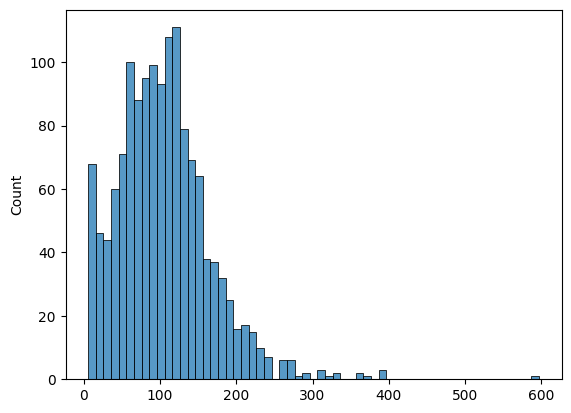

In [494]:
# Distribution of PC texts extracted in each job
sns.histplot(data = [len(x) for x in batch1_data['processed_files']['extracted_pc']], binwidth=10)

In [498]:
df.head()

,Title,Code,Description,Sector Name,Level,Maximum Notational Hours,Minimum Notational Hours,Version,Originally Approved,Valid Till,...,Proposed Occupation,Progression Pathway,Qualifcation Type,Adopted Qualifcation,Training Delivery Hours,NQR code,Qf link,pdf_number,nco_code_full,nco_4digit_code
0,Fire Safety Technician (Oil & Gas),2020/HYC/HSSCI/3611,The main responsibility of the fire safety tec...,Hydrocarbon,Level 4,450 Hours,450 Hours,Version,17 Nov 2022,16 Nov 2025,...,"Management of Health, Safety and Environment (...",Senior Fire Safety Technician,General Qualification,N.A.,"{""Theory"":""120"",""Practical"":""240"",""Employabili...",2020/HYC/HSSCI/3611,https://www.nqr.gov.in/qualification/file/STT-...,0,[3119.0800],{3119}
1,Hindi Typist,2020/OAFM/MEPSC/03792,"The Hindi Typist, is responsible for formattin...",Management,Level 4,450 Hours,390 Hours,Version,17 Nov 2022,17 Nov 2025,...,Office Support,Multi-functional Office Executive,General Qualification,N.A.,"{""Theory"":""150"",""Practical"":""180"",""Employabili...",2020/OAFM/MEPSC/03792,https://www.nqr.gov.in/qualification/file/QFil...,1,[4131.9900],{4131}
2,Certificate Course in Coding Skills,2020/ITES/ASAP/03802,Individuals at this job are responsible for de...,IT-ITeS,Level 5,270 Hours,270 Hours,Version,25 Jun 2020,01 Mar 2026,...,Software Engineer /Project Engineer,"VERTICAL PROGRESSION \nEngineer Trainee, Proje...","Future Skills Qualification,General Qualification",N.A.,"{""Theory"":""36"",""Practical"":""204"",""Employabilit...",2020/ITES/ASAP/03802,https://www.nqr.gov.in/qualification/file/Q%20...,2,[2512.0800],{2512}
3,Transit and Self-Loading Mixer Operator,2020/CON/IESC/3881,Transit and Self-Loading Mixer operator drives...,Infrastructure,Level 4,390 Hours,390 Hours,Version,17 Oct 2019,17 Oct 2022,...,Transit and Self-Loading Mixer Operator,Senior Transit and Self-Loading mixer operator,General Qualification,N.A.,"{""Theory"":""90"",""Practical"":""150"",""Employabilit...",2020/CON/IESC/3881,https://nqr.gov.in/sites/default/files/QF%20-I...,3,[8114.0300],{8114}
4,AI – Data Architect,2020/ITES/ITSSC/04327,Individuals at this job must be responsible fo...,IT-ITeS,Level 7,750 Hours,660 Hours,Version,19 Dec 2018,22 Sep 2025,...,Artificial Intelligence and Big Data Analytics,"Solutions Architect, Senior Database Administr...",Upskilling Qualification,N.A.,"{""Theory"":""180"",""Practical"":""330"",""Employabili...",2020/ITES/ITSSC/04327,https://www.nqr.gov.in/qualification/file/SSC%...,4,NaN,NaN


In [ ]:
# Adding extracted PC text to df

## Initializing the column
df['pc_text'] = None

# Adding pc text for valid rows
for i,row in enumerate(batch1_data['processed_files']['row_number']):
    row_index = int(row)
    df.at[row_index,'pc_text'] = batch1_data['processed_files']['extracted_pc'][i]

## Batch - 2: Extracting based on header and footer

In [ ]:
# I tried extracting the remaining PCs using table format. See the code below.
#   It extracts everything between assessment criteria and total marks (with some additional filters). However, the extraction quality is really bad.
# Therefore, results from this code have not been used.

In [ ]:
'''batch2_data = {'unprocessed_files': {'row_number': [],
                                     'pdf_number': []},
                'processed_files': {'row_number': [],
                                    'pdf_number': [],
                                    'unclean_pc': []}
                                     }'''

In [ ]:
'''temp_list = [x for x in df.index if str(x) not in set(trial_data['processed_files']['row_number'])]'''

In [ ]:
"""#for i in tqdm(trial_data['unprocessed_files']['row_number']):
for i in tqdm(temp_list):
    
    # Retreiving unprocessed file name and number
    file = df.loc[i,'pdf_number']
    file_name = str(file) + ".pdf"
    full_path = base_path + r"/" + file_name

    # Initialising header and footer booleans and indexes
    has_header = False
    has_footer = False
    header_index = None
    footer_index = None

    # Extract PDF text and do successive processing
    try:
        with pdfplumber.open(full_path) as pdf:
            
            
            # Collate all rows in the tables together 
            all_tables = []
            
            
            # Colating only relavant rows
            selected_tables = []
            
            
            # Adding all rows to 'all_tables'
            for page in pdf.pages:
                for table in page.extract_tables():
                    for row in table:

                        # Cleaning
                        row_clean = [text.lower() if text else None for text in row ]
                        row_clean = [re.sub(r'\s+', ' ', text) if text else None for text in row_clean]

                        # Appending rows to all tables
                        all_tables.append(row_clean)

            
            # Checking for header condition
            for j,row in enumerate(all_tables):
                        
                        # Initialising module and assessment critera conditins
                        module_cond = False
                        assess_criteria_cond = False
                        
                        # Presence of 'module name' in the row header
                        module_pattern = re.compile(r"""
                                                        module\s?name
                                                    """, 
                                                    re.VERBOSE)
                        module_cond = any([re.findall(module_pattern, cell) if cell else None for cell in row])

                        # Presence of assessment criteria in the row header
                        assess_criteria_pattern = re.compile(r"""
                                                        assessment\s?criteria
                                                    """, 
                                                    re.VERBOSE)
                        assess_criteria_cond = any([re.findall(assess_criteria_pattern, cell) if cell else None for cell in row])

                        if module_cond and assess_criteria_cond == True:
                                has_header = True
                                if header_index is None:
                                      header_index = j
                                break
                
            # Checking for footer condition
            if header_index is not None: 
                temp_foot_index = []
                for k, row in enumerate(all_tables[header_index+1:], start=header_index+1):
                            
                            # Initialising 'grand total' or 'total marks condition'
                            gtotal_cond = False

                            # Checking for 'grand total' or 'total marks' in footer
                            gtotal_pattern = re.compile(r'''
                                                        grand\s?total
                                                        |
                                                        total\s?marks?
                                                        ''', 
                                                        re.VERBOSE)
                            gtotal_cond = any([re.findall(gtotal_pattern, cell) if cell else None for cell in row])
                            if has_header and gtotal_cond:
                                    has_footer = True
                                    temp_foot_index.append(k)
                
                # Storing the index of the last row  
                if temp_foot_index:
                      footer_index = temp_foot_index[-1]
                        
    except Exception as e:
        print(e)
    
    # Append if the relavant rows are successsfully extracted
    if has_header and has_footer:
            selected_tables = all_tables[header_index:footer_index+1]
            batch2_data['processed_files']['pdf_number'].append(str(file))
            batch2_data['processed_files']['row_number'].append(i)
            batch2_data['processed_files']['unclean_pc'].append(selected_tables)
    else:
          batch2_data['unprocessed_files']['pdf_number'].append(str(file))
          batch2_data['unprocessed_files']['row_number'].append(i)"""

 42%|████▏     | 280/660 [15:02<28:08,  4.44s/it]  Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern3' is an invalid float value
 43%|████▎     | 281/660 [15:10<33:26,  5.29s/it]Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke color because /'Pattern1' is an invalid float value
Cannot set gray non-stroke color because /'Pattern2' is an invalid float value
Cannot set gray non-stroke colo

<Axes: ylabel='Count'>

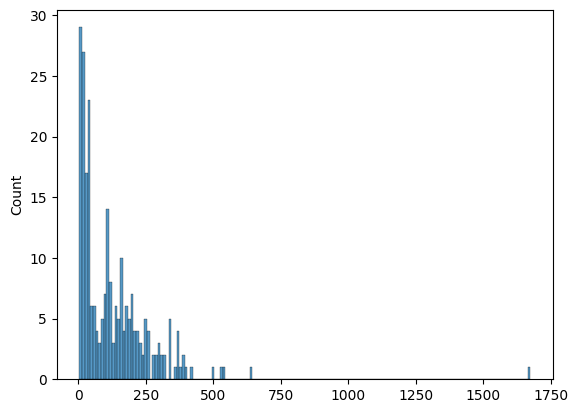

In [ ]:
'''# Distribution of PC texts extracted in each job
sns.histplot(data = [len(x)-2 for x in batch2_data['processed_files']['unclean_pc']], binwidth=10)'''

In [ ]:
"""batch2_data['processed_files']['clean_pc'] = []
for i,job in enumerate(batch2_data['processed_files']['unclean_pc']):
    selected_tables = set()
    
    # Consider all except first and last rows
    for row in job[1:-1]:
        valid_cells = set()
        for cell in row:
            if cell:
                cell_length = len(cell.split())
                # Only consider cells that have more than two words (separated by space)
                if cell_length>2:
                    # Removing leading and trailing spaces
                    cell_clean = cell.strip()
                    # Removing extra spaces introduced by sub
                    cell_clean = re.sub(r'\s+', ' ', cell_clean).strip()
                    valid_cells.add(cell_clean)
        
        # Selecting Longest cell
        cell_len = [len(x.split()) for x in valid_cells]
        if cell_len:
            index_max_cell = cell_len.index(max(cell_len))
            selected_cell = list(valid_cells)[index_max_cell]
            selected_tables.add(selected_cell)
    print(f'Processsing {i}')
    #print(selected_tables)

    if len(selected_tables)>2:
        # Cleaning selected tables
        selected_tables_1 = [re.sub(r'''[0-9]+\.|[\u2022\u2023\u25E6\u2043\u2219\uf0b7]''', r'''##pctask##''', x) for x in selected_tables]
        clean_table = []
        for x in selected_tables_1:
            if len(x.split('''##pctask##''')) == 1:
                clean_table.append(x)
            elif len(x.split(sep = '''##pctask##'''))>1:
                for sent in x.split('''##pctask##'''):
                    if sent.strip():
                        clean_table.append(sent.strip())
        batch2_data['processed_files']['clean_pc'].append(clean_table)
        print(batch2_data['processed_files']['pdf_number'][i])
        print(clean_table)
    else:
        batch2_data['processed_files']['clean_pc'].append(None)"""

Processsing 0
2
['online interactive tool', 'design thinking in practice', 'software testing and project management tools.', 'dive into programming - python basics & application of python.', 'setting up platform skills for design thinking & orientation towards sustainability', 'classroom activities (roboquest)', 'project requirement and design', 'logical puzzles and games', 'the helping hands', 'introduction to programming: the what, why & how of programming.', 'project planning and work division', 'exploring the possibilities', 'implementation & testing', 'roboquest part ii', 'ir', '0 exploration and mind mapping', 'introduction to database and sql', 'waterfall vs agile', 'come with a project idea for the next week.', 'design of software understanding the importance of software designing. how big companies does the magic?', 'agile development demo by students', 'asp/ssc/n0204 – community linking']
Processsing 1
40
['coordinate with stakeholders', 'organize resources for the plumbing t

<Axes: ylabel='Count'>

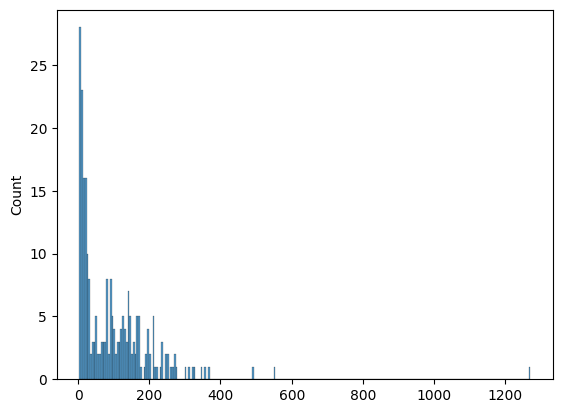

In [ ]:
'''sns.histplot(data = [len(x) for x in batch2_data['processed_files']['clean_pc'] if x], binwidth=5)'''

# Exporting

In [ ]:
df.to_parquet('Jobs and skills database 15Sept25.parquet')